# Rainfall Weather Prediction Model

## Prelude:

Rainfall prediction can be pretty much handy in taking some vital decisions. For example repairs of the infrastructure or buildings. Unexpected rain can spoil the agenda or even cause some dameges. Alongwith, prediction of probaility of rains it is equally important to forecast the amount of rainfall.

## About the variables:
Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

THe dependent variable:

Rainfall  -The amount of rainfall recorded for the day in mm

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


## Problem Statement
We have to build two models-
1. Regression to predict the amount of rainfall

2. Classification to predict if it rains tomorrow or not

In [1]:
!pip install pyforest


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!pip install sklearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
# Importing necessary packages

# Importing fundamental packages
import warnings
warnings.filterwarnings("ignore")
from IPython.core.interactiveshell import InteractiveShell        ## To display multiple outputs
InteractiveShell.ast_node_interactivity = "all"
import pyforest            

## For visualization
import matplotlib.pyplot as plt                                         
%matplotlib inline

import seaborn as sns

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

## Data Pre-Processing Packages
from scipy.stats import chi2_contingency
from sklearn import metrics
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from scipy.stats import zscore
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from sklearn.datasets import make_blobs
from sklearn.cluster import DBSCAN
from collections import Counter
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import KFold
from sklearn.feature_selection import RFE
from sklearn.preprocessing import scale
from sklearn.datasets import make_classification
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE

## To create copy of data
import copy

## Pipeline Packages

from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline


## Ensemble Learning Algorithms Packages

from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import loguniform
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingRegressor

## Evaluation Metrics Packages
import statsmodels.api as sm
from scipy.stats import f
from statsmodels.formula.api import ols
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.utils import resample
from sklearn import metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import preprocessing
from sklearn.metrics import average_precision_score, confusion_matrix, accuracy_score, classification_report, plot_confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error as mse

# Bagging and Boosting
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import AdaBoostClassifier                           

# Saving the model
import pickle

In [4]:
def read(link):
    global data

    data=pd.read_csv(link)
    
    data=pd.DataFrame(data)
    print(data)

In [5]:
read(link="weatherAUS.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

            Date Location  MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  \
0     2008-12-01   Albury     13.4     22.9       0.6          NaN       NaN   
1     2008-12-02   Albury      7.4     25.1       0.0          NaN       NaN   
2     2008-12-03   Albury     12.9     25.7       0.0          NaN       NaN   
3     2008-12-04   Albury      9.2     28.0       0.0          NaN       NaN   
4     2008-12-05   Albury     17.5     32.3       1.0          NaN       NaN   
...          ...      ...      ...      ...       ...          ...       ...   
8420  2017-06-21    Uluru      2.8     23.4       0.0          NaN       NaN   
8421  2017-06-22    Uluru      3.6     25.3       0.0          NaN       NaN   
8422  2017-06-23    Uluru      5.4     26.9       0.0          NaN       NaN   
8423  2017-06-24    Uluru      7.8     27.0       0.0          NaN       NaN   
8424  2017-06-25    Uluru     14.9      NaN       0.0          NaN       NaN   

     WindGustDir  WindGustSpeed WindDir

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [7]:
data.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Date,8425,3004,2011-01-31,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Location,8425,12,Melbourne,1622,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MinTemp,8350.0,NaN,NaN,NaN,13.193305,5.403596,-2.0,9.2,13.3,17.4,28.5
MaxTemp,8365.0,NaN,NaN,NaN,23.859976,6.136408,8.2,19.3,23.3,28.0,45.5
Rainfall,8185.0,NaN,NaN,NaN,2.805913,10.459379,0.0,0.0,0.0,1.0,371.0
Evaporation,4913.0,NaN,NaN,NaN,5.389395,5.044484,0.0,2.6,4.6,7.0,145.0
Sunshine,4431.0,NaN,NaN,NaN,7.632205,3.896235,0.0,4.75,8.7,10.7,13.9
WindGustDir,7434,16,N,713,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WindGustSpeed,7434.0,NaN,NaN,NaN,40.174469,14.665721,7.0,30.0,39.0,50.0,107.0
WindDir9am,7596,16,N,906,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Dropping missing values for Rainfall as it is our target variable for regression and has lower than target variable RainTomorrow for classification

In [8]:
data=data.dropna(subset=["Rainfall"])

In [9]:
#filling missing values in object dtype with mode

data['RainToday']=data['RainToday'].fillna(data['RainToday'].mode()[0])
data['Cloud9am']=data['Cloud9am'].fillna(data['Cloud9am'].mode()[0])
data['Cloud3pm']=data['Cloud3pm'].fillna(data['Cloud3pm'].mode()[0])
data['WindGustDir']= data['WindGustDir'].fillna(data['WindGustDir'].mode()[0])
data['WindDir9am']= data['WindDir9am'].fillna(data['WindDir9am'].mode()[0])
data['WindDir3pm']=data['WindDir3pm'].fillna(data['WindDir3pm'].mode()[0])

#filling missing values with mean
data['Sunshine']=data['Sunshine'].fillna(data['Sunshine'].mean())

data['MinTemp']=data['MinTemp'].fillna(data['MinTemp'].mean())
data['MaxTemp']=data['MaxTemp'].fillna(data['MaxTemp'].mean())
data['MaxTemp']=data['MaxTemp'].fillna(data['MaxTemp'].mean())

data['Pressure9am']=data['Pressure9am'].fillna(data['Pressure9am'].mean())
data['Pressure3pm']=data['Pressure3pm'].fillna(data['Pressure3pm'].mean())
data['Temp3pm']=data['Temp3pm'].fillna(data['Temp3pm'].mean())
data['Temp9am']=data['Temp9am'].fillna(data['Temp9am'].mean())

#filling missing values with median
data['Humidity9am']=data['Humidity9am'].fillna(data['Humidity9am'].median())
data['Humidity3pm']=data['Humidity3pm'].fillna(data['Humidity3pm'].median())
data['Evaporation']= data['Evaporation'].fillna(data['Evaporation'].median())
data['WindGustSpeed']=data['WindGustSpeed'].fillna(data['WindGustSpeed'].median())
data['WindSpeed9am']=data['WindSpeed9am'].fillna(data['WindSpeed9am'].median())
data['WindSpeed3pm']=data['WindSpeed3pm'].fillna(data['WindSpeed3pm'].median())

In [10]:
data['Date']=pd.to_datetime(data['Date'])

<IPython.core.display.Javascript object>

In [11]:
data['year']= data.Date.dt.year
data['month']= data.Date.dt.month

data=data.drop(["Date"],axis=1)

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8185 entries, 0 to 8424
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       8185 non-null   object 
 1   MinTemp        8185 non-null   float64
 2   MaxTemp        8185 non-null   float64
 3   Rainfall       8185 non-null   float64
 4   Evaporation    8185 non-null   float64
 5   Sunshine       8185 non-null   float64
 6   WindGustDir    8185 non-null   object 
 7   WindGustSpeed  8185 non-null   float64
 8   WindDir9am     8185 non-null   object 
 9   WindDir3pm     8185 non-null   object 
 10  WindSpeed9am   8185 non-null   float64
 11  WindSpeed3pm   8185 non-null   float64
 12  Humidity9am    8185 non-null   float64
 13  Humidity3pm    8185 non-null   float64
 14  Pressure9am    8185 non-null   float64
 15  Pressure3pm    8185 non-null   float64
 16  Cloud9am       8185 non-null   float64
 17  Cloud3pm       8185 non-null   float64
 18  Temp9am 

In [13]:
data_cat = pd.DataFrame()
data_num = pd.DataFrame()
for i in data.columns:
    if data[i].dtype == "O":
        data_cat[i] = data[i]
    else:
        data_num[i] = data[i]
        


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [14]:
for i in data_cat:
    crosstab= pd.crosstab(data_cat[i], data_cat["RainTomorrow"])
    
    print (" h0: Average ", i, " of an user does not affect probability of Rainfall for tomorrow")
    print (" ha: Average ",i," of an user does affect probability of Rainfall for tomorrow")
    
# defining the table
    stat, p, dof, expected = chi2_contingency(crosstab)
    
# interpret p-value
    alpha = 0.05
    print("The result for chi-square test between" ,i, "& "," Trust of the user")
    print("p value is " , str(p))
    if p <= alpha:
        print('Dependent (reject H0)')
    else:
        print('Independent (H0 holds true)')

<IPython.core.display.Javascript object>

 h0: Average  Location  of an user does not affect probability of Rainfall for tomorrow
 ha: Average  Location  of an user does affect probability of Rainfall for tomorrow
The result for chi-square test between Location &   Trust of the user
p value is  1.211041399014546e-08
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  WindGustDir  of an user does not affect probability of Rainfall for tomorrow
 ha: Average  WindGustDir  of an user does affect probability of Rainfall for tomorrow
The result for chi-square test between WindGustDir &   Trust of the user
p value is  3.802874829956362e-11
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  WindDir9am  of an user does not affect probability of Rainfall for tomorrow
 ha: Average  WindDir9am  of an user does affect probability of Rainfall for tomorrow
The result for chi-square test between WindDir9am &   Trust of the user
p value is  4.245986151438813e-13
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  WindDir3pm  of an user does not affect probability of Rainfall for tomorrow
 ha: Average  WindDir3pm  of an user does affect probability of Rainfall for tomorrow
The result for chi-square test between WindDir3pm &   Trust of the user
p value is  4.938144413101772e-10
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  RainToday  of an user does not affect probability of Rainfall for tomorrow
 ha: Average  RainToday  of an user does affect probability of Rainfall for tomorrow
The result for chi-square test between RainToday &   Trust of the user
p value is  2.6032918380382933e-187
Dependent (reject H0)


<IPython.core.display.Javascript object>

 h0: Average  RainTomorrow  of an user does not affect probability of Rainfall for tomorrow
 ha: Average  RainTomorrow  of an user does affect probability of Rainfall for tomorrow
The result for chi-square test between RainTomorrow &   Trust of the user
p value is  0.0
Dependent (reject H0)


In [15]:
#Lets check the value count of each column to see if there are any unexpected and unwanted entries present in the column.
for i in data_cat.columns:
        print(data_cat[i].value_counts())
        print('\n','XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX','\n')

Melbourne       1502
PerthAirport    1204
Williamtown     1154
Albury           898
Newcastle        808
CoffsHarbour     610
Brisbane         574
Penrith          479
Wollongong       466
Darwin           250
Adelaide         201
Uluru             39
Name: Location, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

N      1657
SW      560
E       550
SSE     548
S       544
WNW     516
W       489
WSW     484
SE      471
ENE     403
SSW     383
NW      377
NE      348
NNE     341
ESE     301
NNW     213
Name: WindGustDir, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

N      1668
SW      681
NW      608
WSW     519
SE      497
WNW     466
SSW     459
ENE     429
NNE     425
W       404
NE      400
S       384
E       376
SSE     356
NNW     266
ESE     247
Name: WindDir9am, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

SE     1092
S       694
SSE     602
WSW     566
NE      544
N       518
SW      481
WNW     473
NW      462
ESE     455
W       449
E    

In [16]:
#Lets check the value count of each column to see if there are any unexpected and unwanted entries present in the column.
for i in data_cat.columns:
        print(data_cat[i].value_counts())
        print('\n','XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX','\n')

Melbourne       1502
PerthAirport    1204
Williamtown     1154
Albury           898
Newcastle        808
CoffsHarbour     610
Brisbane         574
Penrith          479
Wollongong       466
Darwin           250
Adelaide         201
Uluru             39
Name: Location, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

N      1657
SW      560
E       550
SSE     548
S       544
WNW     516
W       489
WSW     484
SE      471
ENE     403
SSW     383
NW      377
NE      348
NNE     341
ESE     301
NNW     213
Name: WindGustDir, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

N      1668
SW      681
NW      608
WSW     519
SE      497
WNW     466
SSW     459
ENE     429
NNE     425
W       404
NE      400
S       384
E       376
SSE     356
NNW     266
ESE     247
Name: WindDir9am, dtype: int64

 XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX 

SE     1092
S       694
SSE     602
WSW     566
NE      544
N       518
SW      481
WNW     473
NW      462
ESE     455
W       449
E    

In [17]:
data_2=copy.deepcopy(data)

### Data Visualization

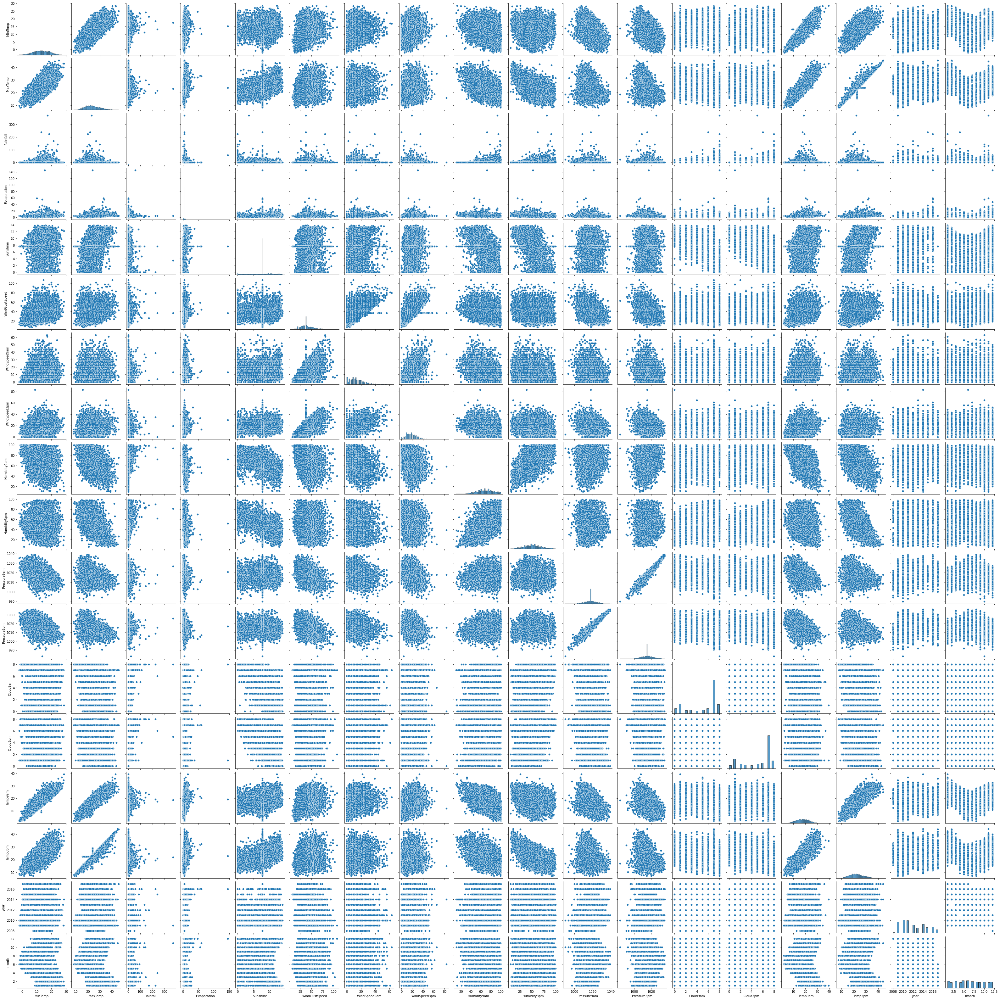

In [18]:
# Pair Plot
sns.pairplot(data_2)

In [19]:
def outlier(mydata):                        # Outlier Plotting
    for i in mydata.columns:
        fig = px.box(mydata, y= i, width=600, height=400, title=i, template="plotly_dark")
        fig.show()

In [20]:
outlier(mydata=data_2.drop(["Rainfall","RainTomorrow"],axis=1))

In [21]:
## Histogram for all the variables using plotly_express

for i in data_2.columns:
    fig = px.histogram(data_2, x= i, histfunc = "count", 
                       width=750, height=600, title = "Histogram for " + i, 
                       template="plotly_dark", cumulative=True)

    fig.show() 

<Figure size 720x432 with 0 Axes>

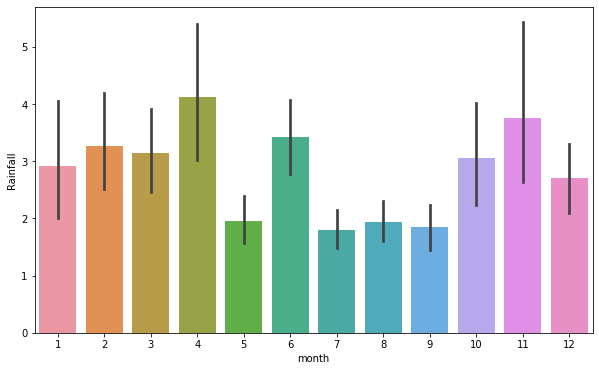

In [22]:
plt.figure(figsize=(10,6))
sns.barplot(x='month',y='Rainfall',data=data_2)


In [23]:
# Encoding Variables
enc = LabelEncoder()    
data_cat["Location"] = enc.fit_transform(data_cat["Location"])
data_cat["WindGustDir"] = enc.fit_transform(data_cat["WindGustDir"])
data_cat["WindDir9am"] = enc.fit_transform(data_cat["WindDir9am"])
data_cat["WindDir3pm"] = enc.fit_transform(data_cat["WindDir3pm"])

In [24]:
def convert(val):
    if val == str("Yes"):
        return 1           # Yes
    
    else:
        return 0          # No

In [25]:
data_cat['RainTomorrow'] = data_cat['RainTomorrow'].apply(convert)
data_cat['RainToday'] = data_cat['RainToday'].apply(convert)

In [26]:
data_2=pd.concat([data_cat,data_num],axis=1)

<IPython.core.display.Javascript object>

In [27]:
data_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8185 entries, 0 to 8424
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       8185 non-null   int64  
 1   WindGustDir    8185 non-null   int64  
 2   WindDir9am     8185 non-null   int64  
 3   WindDir3pm     8185 non-null   int64  
 4   RainToday      8185 non-null   int64  
 5   RainTomorrow   8185 non-null   int64  
 6   MinTemp        8185 non-null   float64
 7   MaxTemp        8185 non-null   float64
 8   Rainfall       8185 non-null   float64
 9   Evaporation    8185 non-null   float64
 10  Sunshine       8185 non-null   float64
 11  WindGustSpeed  8185 non-null   float64
 12  WindSpeed9am   8185 non-null   float64
 13  WindSpeed3pm   8185 non-null   float64
 14  Humidity9am    8185 non-null   float64
 15  Humidity3pm    8185 non-null   float64
 16  Pressure9am    8185 non-null   float64
 17  Pressure3pm    8185 non-null   float64
 18  Cloud9am

<Figure size 3600x3600 with 0 Axes>

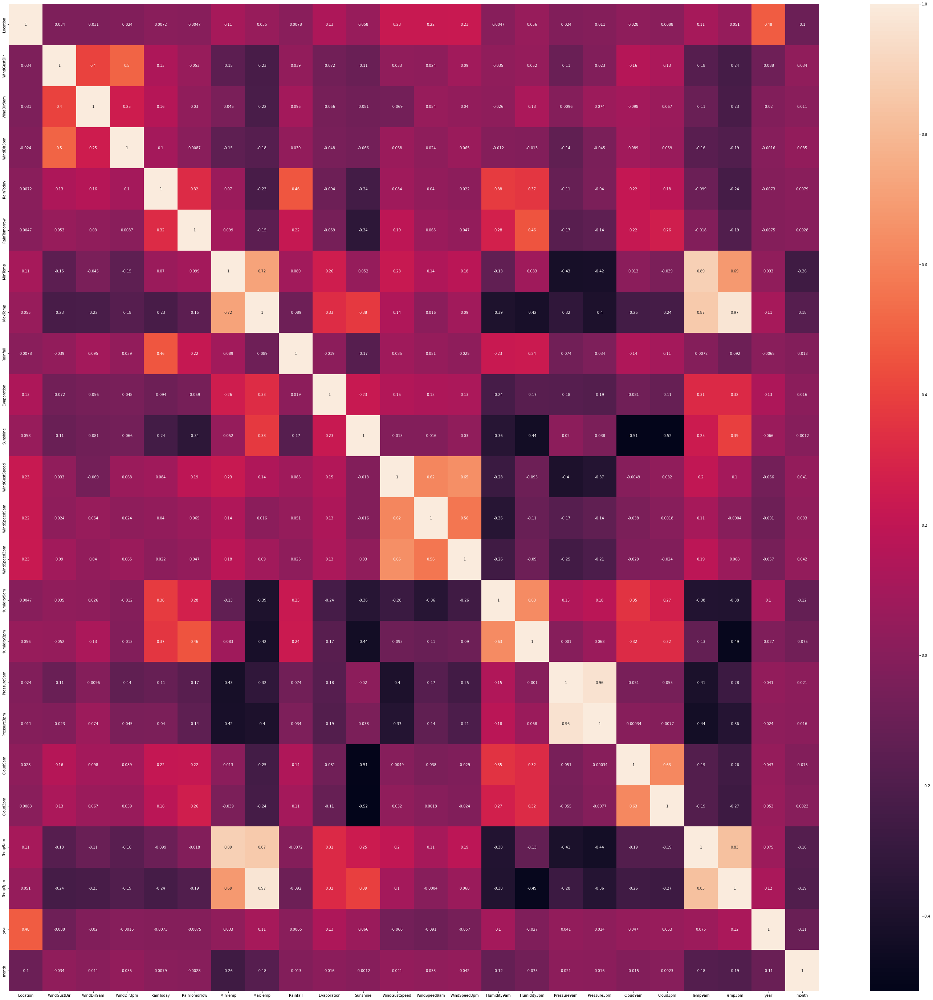

In [28]:
# plotting heat map to check correlation using Pearson

plt.figure(figsize=(50,50))                      
plot=sns.heatmap(data_2.corr(method = "pearson"), annot = True)
fig=plot.get_figure()
fig.savefig("heat.png")

<Figure size 1440x2520 with 0 Axes>

Text(0.5, 0, 'Location')

Text(0.5, 0, 'WindGustDir')

Text(0.5, 0, 'WindDir9am')

Text(0.5, 0, 'WindDir3pm')

Text(0.5, 0, 'RainToday')

Text(0.5, 0, 'RainTomorrow')

Text(0.5, 0, 'MinTemp')

Text(0.5, 0, 'MaxTemp')

Text(0.5, 0, 'Rainfall')

Text(0.5, 0, 'Evaporation')

Text(0.5, 0, 'Sunshine')

Text(0.5, 0, 'WindGustSpeed')

Text(0.5, 0, 'WindSpeed9am')

Text(0.5, 0, 'WindSpeed3pm')

Text(0.5, 0, 'Humidity9am')

Text(0.5, 0, 'Humidity3pm')

Text(0.5, 0, 'Pressure9am')

Text(0.5, 0, 'Pressure3pm')

Text(0.5, 0, 'Cloud9am')

Text(0.5, 0, 'Cloud3pm')

Text(0.5, 0, 'Temp9am')

Text(0.5, 0, 'Temp3pm')

Text(0.5, 0, 'year')

Text(0.5, 0, 'month')

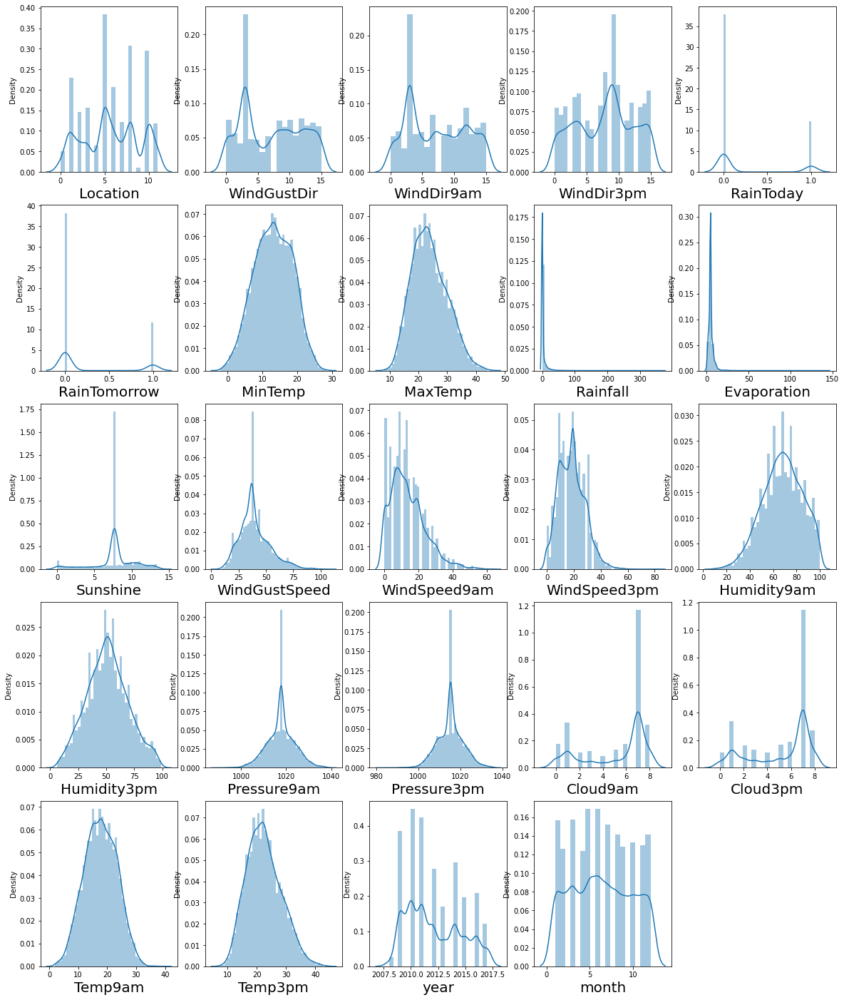

In [29]:
plt.figure(figsize =(20,35), facecolor='white')
plotnumber=1
for i in data_2.columns:
    if plotnumber <= 35:
        ax = plt.subplot(7,5,plotnumber)
        sns.distplot(data_2[i])
        plt.xlabel(i,fontsize=20)
    
    plotnumber +=1
plt.show()

"Humidity3pm","MaxTemp","MinTemp","Temp9am" and "Temp3pm" have high multicollinearity

In [30]:
data_2= data_2.drop(["Humidity3pm","MaxTemp","MinTemp","Temp9am","Temp3pm"],axis=1)

### Outlier Treatment

In [31]:
for i in data_2.drop(['Rainfall','RainTomorrow'],axis=1).columns:
    data_2[i] = np.where(data_2[i] > (data_2[i].quantile(0.75) + (data_2[i].quantile(0.75) - data_2[i].quantile(0.25))*1.5),
                           (data_2[i].quantile(0.75) + (data_2[i].quantile(0.75) - data_2[i].quantile(0.25))*1.5),
                          np.where(data_2[i] < (data_2[i].quantile(0.25) - (data_2[i].quantile(0.75) - data_2[i].quantile(0.25))*1.5),
                           (data_2[i].quantile(0.25) - (data_2[i].quantile(0.75) - data_2[i].quantile(0.25))*1.5),data_2[i]))
    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [32]:
outlier(mydata=data_2.drop(["Rainfall","RainTomorrow"],axis=1))


In [33]:
data_2.skew()

Location         -0.048193
WindGustDir       0.128931
WindDir9am        0.170898
WindDir3pm       -0.112017
RainToday         0.000000
RainTomorrow      1.249812
Rainfall         13.028837
Evaporation       0.061841
Sunshine          0.470945
WindGustSpeed     0.600288
WindSpeed9am      0.747682
WindSpeed3pm      0.342403
Humidity9am      -0.235666
Pressure9am      -0.003840
Pressure3pm       0.021122
Cloud9am         -0.823926
Cloud3pm         -0.775390
year              0.425323
month             0.049817
dtype: float64

## Part - I (Regression)

### Splitting Data into Train and Test

In [34]:
def split (data,target):
    data_reset_index = data.reset_index(drop=True)
# Data split
    global x
    global y
    global x_train
    global y_train
    global x_test
    global y_test
# Segregate Feature & Target Variables
    x = data_reset_index.drop(target, axis=1)
    y = data_reset_index[target]
    x_train,x_test,y_train,y_test = train_test_split(x,y, test_size=0.3, random_state=3)
    
    print(x_train.info())
    ("\n")
    print(x_test.info())
    ("\n")
    print(y_train.shape)
    ("\n")
    print(y_test.shape)
    ("\n")

In [35]:
split(data=data_2,
      target="Rainfall")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5729 entries, 838 to 5994
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       5729 non-null   float64
 1   WindGustDir    5729 non-null   float64
 2   WindDir9am     5729 non-null   float64
 3   WindDir3pm     5729 non-null   float64
 4   RainToday      5729 non-null   float64
 5   RainTomorrow   5729 non-null   int64  
 6   Evaporation    5729 non-null   float64
 7   Sunshine       5729 non-null   float64
 8   WindGustSpeed  5729 non-null   float64
 9   WindSpeed9am   5729 non-null   float64
 10  WindSpeed3pm   5729 non-null   float64
 11  Humidity9am    5729 non-null   float64
 12  Pressure9am    5729 non-null   float64
 13  Pressure3pm    5729 non-null   float64
 14  Cloud9am       5729 non-null   float64
 15  Cloud3pm       5729 non-null   float64
 16  year           5729 non-null   float64
 17  month          5729 non-null   float64
dtypes: flo

In [36]:
# Removing skewness using Yeo-Johnson
# Removing data skewness
pt = PowerTransformer(method='yeo-johnson',standardize=True)
    
data_noskew= pt.fit_transform(x.values)
data_noskewtab= pd.DataFrame(data_noskew)
data_noskewtab.columns =x.columns

<IPython.core.display.Javascript object>

In [37]:
data_noskewtab["RainTomorrow"].value_counts()

-0.554346    6261
 1.803928    1924
Name: RainTomorrow, dtype: int64

In [38]:
data_noskewtab.skew()

Location        -0.188178
WindGustDir     -0.184662
WindDir9am      -0.156441
WindDir3pm      -0.245752
RainToday        0.000000
RainTomorrow     1.249812
Evaporation     -0.048206
Sunshine         0.010108
WindGustSpeed    0.001985
WindSpeed9am    -0.105582
WindSpeed3pm    -0.070443
Humidity9am     -0.069273
Pressure9am      0.000072
Pressure3pm     -0.000007
Cloud9am        -0.639419
Cloud3pm        -0.578402
year             0.000000
month           -0.152156
dtype: float64

### Scaling the data

In [39]:
scalar= MinMaxScaler()
scalar.fit(x_train)
x_trainsc =  scalar.transform(x_train)
x_testsc  =  scalar.transform(x_test)

MinMaxScaler()

In [40]:
a= pd.DataFrame(x_trainsc)
b=pd.DataFrame(x_test)
data_features= pd.concat([a,b],axis=0)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

array([[ 0.71029361, -0.73660574],
       [-1.37249558, -0.90719373],
       [ 0.53193774, -0.67826426],
       [ 0.56118416,  1.25087363],
       [ 0.60341561,  1.40632315]])

[0 1 0 2 2 0 1 0 0 1 2 0 2 1 1 2 2 2 2 1 0 2 0 1 0 0 1 1 0 2 2 2 2 2 0 0 0
 0 2 2 1 0 1 1 1 1 1 1 2 1]


3

0

Estimated number of clusters: 3
Estimated number of noise points: 0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Estimated number of clusters: 3')

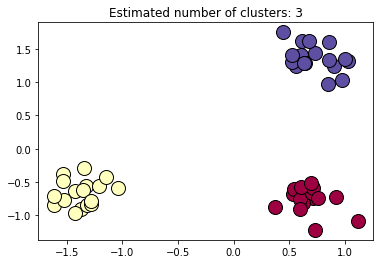

<IPython.core.display.Javascript object>

(array([0, 1, 2]), array([16, 17, 17]))

[]


In [41]:
# DB Scan
# Data creation
centers = [[1, 1], [-1, -1], [1, -1]]
data_features, labels_true = make_blobs(n_samples=50, centers=centers, cluster_std=0.2,random_state=1)  # generate sample blobs
X = StandardScaler().fit_transform(data_features)
X[:5]

# DBSCAN
db = DBSCAN(eps=0.6, min_samples=4, p= 2).fit(X)

labels = db.labels_  # similar to the model.fit() method, it gives the labels of the clustered data

print (labels)

# Setting Length of labels
len(set(labels))

1 if -1 in labels else 0

# Number of clusters in labels, ignoring noise if present.

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0) # the label -1 is considered as noise by the DBSCAN algorithm
n_noise_ = list(labels).count(-1)  # calculating the number of noises (-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

# Below code is for showcasing in diagram. Nothing related to model building

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)  # creating an array of true and false as the same size as db.labels

core_samples_mask[db.core_sample_indices_] = True  # setting the indices of the core regions to True
# Black  is used for noise.
unique_labels = set(labels)  # identifying all the unique labels/clusters

colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]  # creating the list of colours, generating the colourmap



for k, col in zip(unique_labels, colors):
    
    
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)   # assigning class members for each class
    

    xy = X[class_member_mask & core_samples_mask] # creating the list of points for each class
    
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)
    

    xy = X[class_member_mask & ~core_samples_mask] # creating the list of noise points
    
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='b', markersize=14)
    
    

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

# Finding counts in each cluster
np.unique(labels, return_counts=True)

# Selecting only noises
noises = X[labels == 4]

print (noises)

## Model Building

### Linear Regression

In [42]:
lr = LinearRegression()
lr.fit(x_train, y_train)


model = sm.OLS(y_train, x_train).fit()


y_pred = model.predict(x_test)

print("Linear Regression Train Score: ", lr.score(x_train , y_train))

print("Linear Regression Test Score: ", lr.score(x_test , y_test))

print('Mean Absolute Error:', np.round(metrics.mean_absolute_error(y_test, y_pred),2))  
print('Mean Squared Error:', np.round(metrics.mean_squared_error(y_test, y_pred),2))  
print('Root Mean Squared Error:', np.round(np.sqrt(metrics.mean_squared_error(y_test, y_pred)),2))
print(model.summary())

LinearRegression()

Linear Regression Train Score:  0.10664489174166436
Linear Regression Test Score:  0.12503431754778704


<IPython.core.display.Javascript object>

Mean Absolute Error: 4.2


<IPython.core.display.Javascript object>

Mean Squared Error: 115.15


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 10.73
                                 OLS Regression Results                                
Dep. Variable:               Rainfall   R-squared (uncentered):                   0.166
Model:                            OLS   Adj. R-squared (uncentered):              0.164
Method:                 Least Squares   F-statistic:                              66.88
Date:                Mon, 29 Aug 2022   Prob (F-statistic):                   6.03e-210
Time:                        16:31:35   Log-Likelihood:                         -20992.
No. Observations:                5729   AIC:                                  4.202e+04
Df Residuals:                    5712   BIC:                                  4.213e+04
Df Model:                          17                                                  
Covariance Type:            nonrobust                                                  
                    coef    std err          t      P>|t|      [0.025      0.975]
-------

In [43]:
# Cross Validation
rfe = RFE(lr, n_features_to_select=6)             
rfe = rfe.fit(x, y)

r2 = sklearn.metrics.r2_score(y_test, y_pred)

scores = cross_val_score(lr, x, y, scoring='r2', cv=5)
scores   

# create a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
scores = cross_val_score(lr, x, y, scoring='r2', cv=folds)
scores  

scores = cross_val_score(lr, x, y, scoring='neg_mean_squared_error', cv=5)
scores

<IPython.core.display.Javascript object>

array([0.09783209, 0.07480807, 0.12434922, 0.03675644, 0.15659207])

array([0.07729632, 0.13767727, 0.17034399, 0.1245846 , 0.07066662])

array([-171.47644381, -126.75227121,  -91.86076332,  -63.45436205,
        -40.21245336])

### Lasso

In [44]:
lasso_001 = Lasso()

lasso_001.fit(x_train , y_train)


y_pred_lasso = lasso_001.predict(x_test)

print("LASSO Regression Train Score: ", lasso_001.score(x_train , y_train))

print("LASSO Regression Test Score: ", lasso_001.score(x_test , y_test))


print('Mean Absolute Error:', np.round(metrics.mean_absolute_error(y_test, y_pred_lasso),2))  
print('Mean Squared Error:', np.round(metrics.mean_squared_error(y_test, y_pred_lasso),2))  
print('Root Mean Squared Error:', np.round(np.sqrt(metrics.mean_squared_error(y_test, y_pred_lasso)),2))

y_pred = lasso_001.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

coeff_used_002 = np.sum(lasso_001.coef_ != 0)

print("Coefficient used: ",coeff_used_002)

Lasso()

LASSO Regression Train Score:  0.08563472732790955
LASSO Regression Test Score:  0.1006801304797218


<IPython.core.display.Javascript object>

Mean Absolute Error: 4.24


<IPython.core.display.Javascript object>

Mean Squared Error: 118.35


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 10.88


<IPython.core.display.Javascript object>

R2=  0.1006801304797218


<IPython.core.display.Javascript object>

Coefficient used:  6


In [45]:
rfe = RFE(lasso_001, n_features_to_select=6)             
rfe = rfe.fit(x, y)

r2 = sklearn.metrics.r2_score(y_test, y_pred)

scores = cross_val_score(lasso_001, x, y, scoring='r2', cv=5)
scores   

# create a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
scores = cross_val_score(lasso_001, x, y, scoring='r2', cv=folds)
scores  

scores = cross_val_score(lasso_001, x, y, scoring='neg_mean_squared_error', cv=5)
scores

<IPython.core.display.Javascript object>

array([0.07583818, 0.06711389, 0.09509222, 0.04039767, 0.16766107])

array([0.06058142, 0.11540578, 0.14153282, 0.09979529, 0.06610774])

array([-175.65686068, -127.80638169,  -94.92998947,  -63.21449357,
        -39.68469956])

In [46]:
# step-1: create a cross-validation scheme
folds = KFold(n_splits = 3, shuffle = True, random_state = 10)

# step-2: specify range of hyperparameters to tune
hyper_params = [{'alpha': range(0, 10), 'random_state':range(1, 20,2), 'selection': ['cyclic', 'random'] }]

# step-3: perform grid search
# 3.1 specify model
lasso_001 = Lasso()
lasso_001.fit(x_train , y_train)
rfe = RFE(lasso_001)             

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = lasso_001, 
                        param_grid = hyper_params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
grid_result= model_cv.fit(x_train, y_train)   
print('Best Score: ', grid_result.best_score_)

print('Best Params: ', grid_result.best_params_)

Lasso()

Fitting 3 folds for each of 200 candidates, totalling 600 fits
Best Score:  -3.714637971441366
Best Params:  {'alpha': 9, 'random_state': 1, 'selection': 'random'}


In [47]:
lasso_002 = Lasso(alpha = 9 , selection='random', random_state=1)

lasso_002.fit(x_train , y_train)


y_pred_lasso = lasso_002.predict(x_test)

print("LASSO Regression Train Score: ", lasso_002.score(x_train , y_train))

print("LASSO Regression Test Score: ", lasso_002.score(x_test , y_test))

y_pred = lasso_002.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

print('Mean Absolute Error:', np.round(metrics.mean_absolute_error(y_test, y_pred_lasso),2))  
print('Mean Squared Error:', np.round(metrics.mean_squared_error(y_test, y_pred_lasso),2))  
print('Root Mean Squared Error:', np.round(np.sqrt(metrics.mean_squared_error(y_test, y_pred_lasso)),2))



coeff_used_002 = np.sum(lasso_002.coef_ != 0)

print("Coefficient used: ",coeff_used_002)


Lasso(alpha=9, random_state=1, selection='random')

LASSO Regression Train Score:  0.06187251477430822
LASSO Regression Test Score:  0.06587789692824997


<IPython.core.display.Javascript object>

R2=  0.06587789692824997


<IPython.core.display.Javascript object>

Mean Absolute Error: 4.16


<IPython.core.display.Javascript object>

Mean Squared Error: 122.93


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 11.09


<IPython.core.display.Javascript object>

Coefficient used:  2


### Ridge

In [48]:
rr1 = Ridge()                                                   # alpha = regularization hyper-parameter

rr1.fit(x_train, y_train)


y_pred_rr = rr1.predict(x_test)

print("Ridge Regression Train Score: ", rr1.score(x_train, y_train))
print("Ridge Regression Test Score: ", rr1.score(x_test, y_test))
print("\n")
print('Mean Absolute Error:', np.round(metrics.mean_absolute_error(y_test, y_pred_rr),2))  
print('Mean Squared Error:', np.round(metrics.mean_squared_error(y_test, y_pred_rr),2))
print('Root Mean Squared Error:', np.round(np.sqrt(metrics.mean_squared_error(y_test, y_pred_rr)),2))
y_pred = rr1.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

coeff_used_001 = np.sum(rr1.coef_ != 0)

print("Coefficient used:","\n",coeff_used_001)

Ridge()

Ridge Regression Train Score:  0.10664487420577451
Ridge Regression Test Score:  0.12502735344959204




<IPython.core.display.Javascript object>

Mean Absolute Error: 4.2


<IPython.core.display.Javascript object>

Mean Squared Error: 115.14


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 10.73


<IPython.core.display.Javascript object>

R2=  0.12502735344959204


<IPython.core.display.Javascript object>

Coefficient used: 
 17


In [49]:
rfe = RFE(rr1, n_features_to_select=6)             
rfe = rfe.fit(x_train, y_train)

r2 = sklearn.metrics.r2_score(y_test, y_pred)

scores = cross_val_score(rr1, x, y, scoring='r2', cv=5)
scores   

# create a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
scores = cross_val_score(rr1, x, y, scoring='r2', cv=folds)
scores  

scores = cross_val_score(rr1, x, y, scoring='neg_mean_squared_error', cv=5)
scores

<IPython.core.display.Javascript object>

array([0.09782275, 0.07482084, 0.12434082, 0.03675055, 0.15658223])

array([0.07729427, 0.1376815 , 0.17034116, 0.1245785 , 0.07067938])

array([-171.47821959, -126.75052104,  -91.86164412,  -63.45474983,
        -40.21292265])

In [50]:
# Hyperparameter Tuning
# step-1: create a cross-validation scheme
folds = KFold(n_splits = 3, shuffle = True, random_state = 100)

# step-2: specify range of hyperparameters to tune
hyper_params = [{'random_state':list(range(5, 10)), 'tol': list(range(-10, 100,20)), 
                 'solver': ['auto', 'svd','cholesky', 'lsqr', 'sag', 'saga', 'lbfgs']}]


# step-3: perform grid search

# 3.1 specify model
rr1 = Ridge()
rr1.fit(x_train, y_train)

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = rr1,
                        param_grid = hyper_params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds,
                        verbose=1,
                        return_train_score=True)      

# fit the model
grid_result= model_cv.fit(x_train, y_train)   
print('Best Score: ', grid_result.best_score_)

print('Best Params: ', grid_result.best_params_)        

Ridge()

Fitting 3 folds for each of 210 candidates, totalling 630 fits
Best Score:  -3.791274833713833
Best Params:  {'random_state': 6, 'solver': 'sag', 'tol': -10}


In [51]:
rr2 = Ridge( random_state= 5, solver= 'auto', tol= 10)                                                   

rr2.fit(x_train, y_train)


y_pred_rr = rr2.predict(x_test)

print("Ridge Regression Train Score: ", rr2.score(x_train, y_train))
print("Ridge Regression Test Score: ", rr2.score(x_test, y_test))
print("\n")
print('Mean Absolute Error:', np.round(metrics.mean_absolute_error(y_test, y_pred_rr),2))  
print('Mean Squared Error:', np.round(metrics.mean_squared_error(y_test, y_pred_rr),2))
print('Root Mean Squared Error:', np.round(np.sqrt(metrics.mean_squared_error(y_test, y_pred_rr)),2))

y_pred = rr2.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

coeff_used_001 = np.sum(rr2.coef_ != 0)

print("Coefficient used: ",coeff_used_001)

Ridge(random_state=5, tol=10)

Ridge Regression Train Score:  0.10664487420577451
Ridge Regression Test Score:  0.12502735344959204




<IPython.core.display.Javascript object>

Mean Absolute Error: 4.2


<IPython.core.display.Javascript object>

Mean Squared Error: 115.14


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 10.73


<IPython.core.display.Javascript object>

R2=  0.12502735344959204


<IPython.core.display.Javascript object>

Coefficient used:  17


### Elastic Net

In [52]:
lm_elastic1 = ElasticNet()

lm_elastic1.fit(x_train, y_train)



y_pred_elastic = lm_elastic1.predict(x_test)


print("Elastic Net Train Score: ", lm_elastic1.score(x_train , y_train))

print("Elastic Net Test Score: ", lm_elastic1.score(x_test , y_test))


print('Mean Absolute Error: \n', np.round(metrics.mean_absolute_error(y_test, y_pred_elastic),2)) 

print(" ")

print('Mean Squared Error: \n', np.round(metrics.mean_squared_error(y_test, y_pred_elastic),2))

print(" ")

print('Root Mean Squared Error: \n', np.round(np.sqrt(metrics.mean_squared_error(y_test, y_pred_elastic)),2))
print(" ")

y_pred = lm_elastic1.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

coeff_used_003 = np.sum(lm_elastic1.coef_ != 0)

print("Coefficient used: ",coeff_used_003)

ElasticNet()

Elastic Net Train Score:  0.08886510244258494
Elastic Net Test Score:  0.10526930562797387


<IPython.core.display.Javascript object>

Mean Absolute Error: 
 4.23
 


<IPython.core.display.Javascript object>

Mean Squared Error: 
 117.74
 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 
 10.85
 


<IPython.core.display.Javascript object>

R2=  0.10526930562797387


<IPython.core.display.Javascript object>

Coefficient used:  11


In [53]:
rfe = RFE(lm_elastic1, n_features_to_select=6)             
rfe = rfe.fit(x_train, y_train)

r2 = sklearn.metrics.r2_score(y_test, y_pred)

scores = cross_val_score(lm_elastic1, x, y, scoring='r2', cv=5)
scores   

# create a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
scores = cross_val_score(lm_elastic1, x, y, scoring='r2', cv=folds)
scores  

scores = cross_val_score(lm_elastic1, x, y, scoring='neg_mean_squared_error', cv=5)
scores

<IPython.core.display.Javascript object>

array([0.07705561, 0.07051554, 0.09361857, 0.03498029, 0.15863429])

array([0.06224969, 0.11691452, 0.14631791, 0.10182283, 0.06646918])

array([-175.42546224, -127.34035223,  -95.08458338,  -63.57136712,
        -40.11508331])

In [54]:
# step-1: create a cross-validation scheme
folds = KFold(n_splits = 3, shuffle = True, random_state = 100)

# step-2: specify range of hyperparameters to tune
hyper_params = [{'normalize':[True, False],'random_state':list(range(0, 10)), 'tol': list(range(-10, 100, 20)), 
                 'selection': ['cyclic', 'random']}]


# step-3: perform grid search
# 3.1 specify model
lm_elastic = ElasticNet()

lm_elastic.fit(x_train, y_train)
            

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = lm_elastic,
                        param_grid = hyper_params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds,
                        verbose=1,
                        return_train_score=True)
    

# fit the model
grid_result= model_cv.fit(x_train, y_train)   
print('Best Score: ', grid_result.best_score_)

print('Best Params: ', grid_result.best_params_)

ElasticNet()

Fitting 3 folds for each of 240 candidates, totalling 720 fits
Best Score:  -3.7974700176077625
Best Params:  {'normalize': False, 'random_state': 1, 'selection': 'random', 'tol': 10}


In [55]:
lm_elastic2 = ElasticNet( normalize= True, random_state= 0, selection='cyclic', tol= 10)

lm_elastic2.fit(x_train, y_train)



y_pred_elastic = lm_elastic2.predict(x_test)


print("Elastic Net Train Score: ", lm_elastic2.score(x_train , y_train))

print("Elastic Net Test Score: ", lm_elastic2.score(x_test , y_test))


print('Mean Absolute Error: \n', np.round(metrics.mean_absolute_error(y_test, y_pred_elastic),2)) 

print(" ")

print('Mean Squared Error: \n', np.round(metrics.mean_squared_error(y_test, y_pred_elastic),2))

print(" ")

print('Root Mean Squared Error: \n', np.round(np.sqrt(metrics.mean_squared_error(y_test, y_pred_elastic)),2))
print(" ")

y_pred = lm_elastic2.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

coeff_used_003 = np.sum(lm_elastic2.coef_ != 0)

print("Coefficient used: ",coeff_used_003)

ElasticNet(normalize=True, random_state=0, tol=10)

Elastic Net Train Score:  0.0
Elastic Net Test Score:  -0.0016725061306048783


<IPython.core.display.Javascript object>

Mean Absolute Error: 
 4.5
 


<IPython.core.display.Javascript object>

Mean Squared Error: 
 131.82
 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 
 11.48
 


<IPython.core.display.Javascript object>

R2=  -0.0016725061306048783


<IPython.core.display.Javascript object>

Coefficient used:  0


### Support Vector Regression Model

In [56]:
svm1 = SVR()
svm1.fit(x_train, y_train)



y_pred_svm = svm1.predict(x_test)


print("Support Vector Model Train Score: ", svm1.score(x_train , y_train))

print("Support Vector Model Test Score: ", svm1.score(x_test , y_test))


print('Mean Absolute Error: \n', np.round(metrics.mean_absolute_error(y_test, y_pred_svm),2)) 

print(" ")

print('Mean Squared Error: \n', np.round(metrics.mean_squared_error(y_test, y_pred_svm),2))

print(" ")

print('Root Mean Squared Error: \n', np.round(np.sqrt(metrics.mean_squared_error(y_test, y_pred_svm)),2))

print(" ")

y_pred = svm1.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

SVR()

Support Vector Model Train Score:  -0.06299471962704128
Support Vector Model Test Score:  -0.06704004791320872


<IPython.core.display.Javascript object>

Mean Absolute Error: 
 3.15
 


<IPython.core.display.Javascript object>

Mean Squared Error: 
 140.42
 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 
 11.85
 


<IPython.core.display.Javascript object>

R2=  -0.06704004791320872


In [57]:
# create dataset for CV
X, y = make_classification(n_samples=50, n_features=15, random_state=1)
# prepare the cross-validation procedure
cv = KFold(n_splits=10, random_state=1, shuffle=True)
# create model
model = SVR()
# evaluate model
scores = cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
# report performance
print('Accuracy: ' , scores)


Accuracy:  [0.         0.70517961 0.78992613 0.33913382 0.1005017  0.74017756
 0.53629186 0.7316379  0.55894937 0.33513406]


### Decision Tree Regressor

DecisionTreeRegressor(max_depth=1)

DecisionTreeRegressor(max_depth=2)

DecisionTreeRegressor(max_depth=3)

DecisionTreeRegressor(max_depth=4)

DecisionTreeRegressor(max_depth=5)

DecisionTreeRegressor(max_depth=6)

DecisionTreeRegressor(max_depth=7)

DecisionTreeRegressor(max_depth=8)

DecisionTreeRegressor(max_depth=9)

DecisionTreeRegressor(max_depth=1)

DecisionTreeRegressor(max_depth=2)

DecisionTreeRegressor(max_depth=3)

DecisionTreeRegressor(max_depth=4)

DecisionTreeRegressor(max_depth=5)

DecisionTreeRegressor(max_depth=6)

DecisionTreeRegressor(max_depth=7)

DecisionTreeRegressor(max_depth=8)

DecisionTreeRegressor(max_depth=9)

Text(0.5, 0, 'Tree depth')

Text(7.5, 1.17, 'optimum = 7')

Text(0, 0.5, 'Mean squared error')

Text(0.5, 1.0, 'Hyperparameter Tuning')

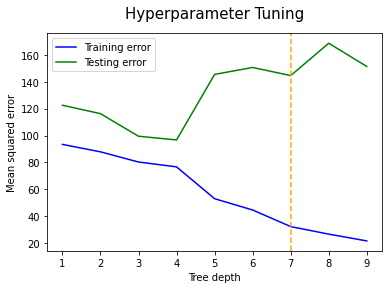

In [58]:
# Plotting
max_depths = range(1, 10)
training_error = []
for max_depth in max_depths:
    model_1 = DecisionTreeRegressor(max_depth=max_depth)
    model_1.fit(x_train, y_train)
    training_error.append(mse(y_train, model_1.predict(x_train)))
    
testing_error = []
for max_depth in max_depths:
    model_2 = DecisionTreeRegressor(max_depth=max_depth)
    model_2.fit(x_train, y_train)
    testing_error.append(mse(y_test, model_2.predict(x_test)))

plt.plot(max_depths, training_error, color='blue', label='Training error')
plt.plot(max_depths, testing_error, color='green', label='Testing error')
plt.xlabel('Tree depth')
plt.axvline(x=7, color='orange', linestyle='--')
plt.annotate('optimum = 7', xy=(7.5, 1.17), color='red')
plt.ylabel('Mean squared error')
plt.title('Hyperparameter Tuning', pad=15, size=15)
plt.legend()

In [59]:
# step-1: create a cross-validation scheme
folds = KFold(n_splits = 3, shuffle = True, random_state = 50)

# step-2: specify range of hyperparameters to tune

hyper_params = [{'criterion':['squared_error','friedman_mse','absolute_error','poisson'],
                 'max_features':['auto','sqrt','log2'],
                'random_state':[0,3,5,7,]}]



# step-3: perform grid search
# 3.1 specify model
dTree = DecisionTreeRegressor()

dTree.fit(x_train, y_train)
            

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = dTree,
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds,
                        verbose=1,
                        return_train_score=True)
    

# fit the model
grid_result= model_cv.fit(x_train, y_train)   
print('Best Score: ', grid_result.best_score_)

print('Best Params: ', grid_result.best_params_)

DecisionTreeRegressor()

Fitting 3 folds for each of 48 candidates, totalling 144 fits
Best Score:  -0.08769052321974113
Best Params:  {'criterion': 'absolute_error', 'max_features': 'auto', 'random_state': 7}


In [60]:
dTree2 = DecisionTreeRegressor(criterion='absolute_error',  max_features='auto', random_state=7)
dTree2.fit(x_train, y_train)
y_predict = dTree2.predict(x_test)

print("Decision Tree Model Train Score: ", dTree2.score(x_train , y_train))

print("Decision Tree Model Test Score: ", dTree2.score(x_test , y_test))


print('Mean Absolute Error: \n', np.round(metrics.mean_absolute_error(y_test, y_predict),2)) 

print(" ")

print('Mean Squared Error: \n', np.round(metrics.mean_squared_error(y_test, y_predict),2))

print(" ")

print('Root Mean Squared Error: \n', np.round(np.sqrt(metrics.mean_squared_error(y_test, y_predict)),2))

print(" ")

y_pred = dTree2.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

DecisionTreeRegressor(criterion='absolute_error', max_features='auto',
                      random_state=7)

Decision Tree Model Train Score:  0.7036399817685246
Decision Tree Model Test Score:  -0.24262182259032583


<IPython.core.display.Javascript object>

Mean Absolute Error: 
 3.07
 


<IPython.core.display.Javascript object>

Mean Squared Error: 
 163.52
 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 
 12.79
 


<IPython.core.display.Javascript object>

R2=  -0.24262182259032583


### Random Forest Regressor

In [61]:
rf_model1= RandomForestRegressor()
rf_model1.fit(x_train, y_train)
rf_model_predict = rf_model1.predict(x_test)

print("Random Forest Model Train Score: ", rf_model1.score(x_train , y_train))

print("Random Forest Model Test Score: ", rf_model1.score(x_test , y_test))


print('Mean Absolute Error: \n', np.round(metrics.mean_absolute_error(y_test, rf_model_predict),2)) 

print(" ")

print('Mean Squared Error: \n', np.round(metrics.mean_squared_error(y_test, rf_model_predict),2))

print(" ")

print('Root Mean Squared Error: \n', np.round(np.sqrt(metrics.mean_squared_error(y_test, rf_model_predict)),2))

print(" ")

y_pred = rf_model1.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

RandomForestRegressor()

Random Forest Model Train Score:  0.8909828729515676
Random Forest Model Test Score:  0.3362816009891899


<IPython.core.display.Javascript object>

Mean Absolute Error: 
 3.03
 


<IPython.core.display.Javascript object>

Mean Squared Error: 
 87.34
 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 
 9.35
 


<IPython.core.display.Javascript object>

R2=  0.3362816009891899


In [62]:
# step-1: create a cross-validation scheme
folds = KFold(n_splits = 3, shuffle = True, random_state = 25)

# step-2: specify range of hyperparameters to tune

hyper_params = [{'criterion':['squared_error','absolute_error','poisson'],
                'max_features':['log2','sqrt',None],
                'random_state':[1,3,5,7],}]



# step-3: perform grid search
# 3.1 specify model
rf = RandomForestRegressor()

rf.fit(x_train, y_train)
            

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = rf,
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds,
                        verbose=1,
                        return_train_score=True)
    

# fit the model
grid_result= model_cv.fit(x_train, y_train)   
print('Best Score: ', grid_result.best_score_)

print('Best Params: ', grid_result.best_params_)

RandomForestRegressor()

Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best Score:  0.23066398806415658
Best Params:  {'criterion': 'squared_error', 'max_features': 'log2', 'random_state': 7}


In [63]:
rf_model2= RandomForestRegressor( criterion='squared_error', max_features= 'log2', random_state=7)
rf_model2.fit(x_train, y_train)
rf_model_predict = rf_model2.predict(x_test)

print("Random Forest Model Train Score: ", rf_model2.score(x_train , y_train))

print("Random Forest Model Test Score: ", rf_model2.score(x_test , y_test))


print('Mean Absolute Error: \n', np.round(metrics.mean_absolute_error(y_test, rf_model_predict),2)) 

print(" ")

print('Mean Squared Error: \n', np.round(metrics.mean_squared_error(y_test, rf_model_predict),2))

print(" ")

print('Root Mean Squared Error: \n', np.round(np.sqrt(metrics.mean_squared_error(y_test, rf_model_predict)),2))

print(" ")

y_pred = rf_model2.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

RandomForestRegressor(max_features='log2', random_state=7)

Random Forest Model Train Score:  0.8964171033625438
Random Forest Model Test Score:  0.42998475492113675


<IPython.core.display.Javascript object>

Mean Absolute Error: 
 2.92
 


<IPython.core.display.Javascript object>

Mean Squared Error: 
 75.01
 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 
 8.66
 


<IPython.core.display.Javascript object>

R2=  0.42998475492113675


### Gradient Boosting Algorithm

In [64]:
gb_model1= GradientBoostingRegressor()
gb_model1.fit(x_train, y_train)
gb_model_predict = gb_model1.predict(x_test)

print("Gradient Boosting Model Train Score: ", gb_model1.score(x_train , y_train))

print("Gradient Boosting Model Test Score: ", gb_model1.score(x_test , y_test))


print('Mean Absolute Error: \n', np.round(metrics.mean_absolute_error(y_test, gb_model_predict),2)) 

print(" ")

print('Mean Squared Error: \n', np.round(metrics.mean_squared_error(y_test, gb_model_predict),2))

print(" ")

print('Root Mean Squared Error: \n', np.round(np.sqrt(metrics.mean_squared_error(y_test, gb_model_predict)),2))

y_pred = gb_model1.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

GradientBoostingRegressor()

Gradient Boosting Model Train Score:  0.5561847856440838
Gradient Boosting Model Test Score:  0.20331227602108393


<IPython.core.display.Javascript object>

Mean Absolute Error: 
 3.48
 


<IPython.core.display.Javascript object>

Mean Squared Error: 
 104.84
 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 
 10.24


<IPython.core.display.Javascript object>

R2=  0.20331227602108393


In [65]:
# step-1: create a cross-validation scheme
folds = KFold(n_splits = 3, shuffle = True, random_state = 50)

# step-2: specify range of hyperparameters to tune

hyper_params = [{'loss':['squared_error','absolute_error','huber', 'quantile'],
                 'learning_rate': [0,0.1,1,3,5,7,10],
                'criterion':['friedman_mse','squared_error','mse']}]



# step-3: perform grid search
# 3.1 specify model
gb_model= GradientBoostingRegressor()

gb_model.fit(x_train, y_train)
            

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = gb_model,
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds,
                        verbose=1,
                        return_train_score=True)
    

# fit the model
grid_result= model_cv.fit(x_train, y_train)   
print('Best Score: ', grid_result.best_score_)

print('Best Params: ', grid_result.best_params_)

GradientBoostingRegressor()

Fitting 3 folds for each of 84 candidates, totalling 252 fits
Best Score:  0.12754180618330377
Best Params:  {'criterion': 'squared_error', 'learning_rate': 0.1, 'loss': 'huber'}


In [66]:
gb_model2= GradientBoostingRegressor( criterion= 'squared_error', learning_rate= 0.1, loss= 'huber')
gb_model2.fit(x_train, y_train)
gb_model_predict = gb_model2.predict(x_test)

print("Gradient Boosting Model Train Score: ", gb_model2.score(x_train , y_train))

print("Gradient Boosting Model Test Score: ", gb_model2.score(x_test , y_test))


print('Mean Absolute Error: \n', np.round(metrics.mean_absolute_error(y_test, gb_model_predict),2)) 

print(" ")

print('Mean Squared Error: \n', np.round(metrics.mean_squared_error(y_test, gb_model_predict),2))

print(" ")

print('Root Mean Squared Error: \n', np.round(np.sqrt(metrics.mean_squared_error(y_test, gb_model_predict)),2))

y_pred = gb_model2.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

GradientBoostingRegressor(criterion='squared_error', loss='huber')

Gradient Boosting Model Train Score:  0.1659893438440787
Gradient Boosting Model Test Score:  0.16918604350863176


<IPython.core.display.Javascript object>

Mean Absolute Error: 
 2.94
 


<IPython.core.display.Javascript object>

Mean Squared Error: 
 109.33
 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 
 10.46


<IPython.core.display.Javascript object>

R2=  0.16918604350863176


### AdaBoost Algorithm

In [67]:
adb_model1= AdaBoostRegressor()
adb_model1.fit(x_train, y_train)
adb_model_predict = adb_model1.predict(x_test)

print("Ada  Boosting Model Train Score: ", adb_model1.score(x_train , y_train))

print("Ada Boosting Model Test Score: ", adb_model1.score(x_test , y_test))


print('Mean Absolute Error: \n', np.round(metrics.mean_absolute_error(y_test, adb_model_predict),2)) 

print(" ")

print('Mean Squared Error: \n', np.round(metrics.mean_squared_error(y_test, adb_model_predict),2))

print(" ")

print('Root Mean Squared Error: \n', np.round(np.sqrt(metrics.mean_squared_error(y_test, adb_model_predict)),2))

y_pred = adb_model1.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

AdaBoostRegressor()

Ada  Boosting Model Train Score:  0.09381718405648631
Ada Boosting Model Test Score:  -0.37700336857456507


<IPython.core.display.Javascript object>

Mean Absolute Error: 
 8.24
 


<IPython.core.display.Javascript object>

Mean Squared Error: 
 181.21
 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 
 13.46


<IPython.core.display.Javascript object>

R2=  -0.37700336857456507


In [68]:
# step-1: create a cross-validation scheme
folds = KFold(n_splits =5, shuffle = True, random_state = 50)

# step-2: specify range of hyperparameters to tune

hyper_params = [{'loss':['linear', 'square', 'exponential'],
                 'learning_rate': [1,5,7,10],
                'random_state':[1,3,5,7]}]



# step-3: perform grid search
# 3.1 specify model
adb_model= AdaBoostRegressor()

adb_model.fit(x_train, y_train)
            

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = adb_model,
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds,
                        verbose=1,
                        return_train_score=True)
    

# fit the model
grid_result= model_cv.fit(x_train, y_train)   
print('Best Score: ', grid_result.best_score_)

print('Best Params: ', grid_result.best_params_)

AdaBoostRegressor()

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best Score:  -0.06775761779922387
Best Params:  {'learning_rate': 1, 'loss': 'square', 'random_state': 7}


In [69]:
adb_model2= AdaBoostRegressor(learning_rate=1, loss='square', random_state=7)
adb_model2.fit(x_train, y_train)
adb_model_predict = adb_model2.predict(x_test)

print("Ada  Boosting Model Train Score: ", adb_model2.score(x_train , y_train))

print("Ada Boosting Model Test Score: ", adb_model2.score(x_test , y_test))


print('Mean Absolute Error: \n', np.round(metrics.mean_absolute_error(y_test, adb_model_predict),2)) 

print(" ")

print('Mean Squared Error: \n', np.round(metrics.mean_squared_error(y_test, adb_model_predict),2))

print(" ")

print('Root Mean Squared Error: \n', np.round(np.sqrt(metrics.mean_squared_error(y_test, adb_model_predict)),2))

y_pred = adb_model2.predict(x_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print("R2= ",r2)

AdaBoostRegressor(learning_rate=1, loss='square', random_state=7)

Ada  Boosting Model Train Score:  0.48159902759302886
Ada Boosting Model Test Score:  -0.18520599577180796


<IPython.core.display.Javascript object>

Mean Absolute Error: 
 4.46
 


<IPython.core.display.Javascript object>

Mean Squared Error: 
 155.97
 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Root Mean Squared Error: 
 12.49


<IPython.core.display.Javascript object>

R2=  -0.18520599577180796


### XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

### Part - II (Classification)

In [70]:
def split (data,target):
    data_reset_index = data.reset_index(drop=True)
# Data split
    global x
    global y
    global x_train
    global y_train
    global x_test
    global y_test
# Segregate Feature & Target Variables
    x = data_reset_index.drop(target, axis=1)
    y = data_reset_index[target]
    x_train,x_test,y_train,y_test = train_test_split(x,y, test_size=0.3, random_state=3)
    
    print(x_train.info())
    ("\n")
    print(x_test.info())
    ("\n")
    print(y_train.shape)
    ("\n")
    print(y_test.shape)
    ("\n")

In [71]:
split(data=data_2,
      target="RainTomorrow")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5729 entries, 838 to 5994
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       5729 non-null   float64
 1   WindGustDir    5729 non-null   float64
 2   WindDir9am     5729 non-null   float64
 3   WindDir3pm     5729 non-null   float64
 4   RainToday      5729 non-null   float64
 5   Rainfall       5729 non-null   float64
 6   Evaporation    5729 non-null   float64
 7   Sunshine       5729 non-null   float64
 8   WindGustSpeed  5729 non-null   float64
 9   WindSpeed9am   5729 non-null   float64
 10  WindSpeed3pm   5729 non-null   float64
 11  Humidity9am    5729 non-null   float64
 12  Pressure9am    5729 non-null   float64
 13  Pressure3pm    5729 non-null   float64
 14  Cloud9am       5729 non-null   float64
 15  Cloud3pm       5729 non-null   float64
 16  year           5729 non-null   float64
 17  month          5729 non-null   float64
dtypes: flo

### Solving Class Imbalance issue using SMOTE

In [72]:
data_2["RainTomorrow"].value_counts()

0    6261
1    1924
Name: RainTomorrow, dtype: int64

In [73]:
# Smote
sm = SMOTE(random_state = 5)

columns = x_train.columns

train_data = pd.concat([x_train,y_train], axis = 1)

train_data.head()
# Fitting the model
x_os_train, y_os_train  = sm.fit_resample(train_data.drop('RainTomorrow', axis = 1), train_data['RainTomorrow'])

y_os_train.value_counts()

## Number of records in Oversampled Train dataset

print('the number of records in x_os_train :', len(x_os_train))
print('the number of records in y_os_train :', len(y_os_train))
print('the number of records in x_test :', len(x_test))
print('the number of records in y_test :', len(y_test))

# Target Class Distribution for Train and test Dataset

print('the ratio of 0 and 1 in y_os_train:')

print(y_os_train.value_counts(normalize = True)*100)

print('the ratio of 0 and 1 in y_test:')

print(y_test.value_counts(normalize = True)*100)

print("Before UpSampling, counts of label '1': {}".format(sum(y_train==1)))
print("Before UpSampling, counts of label '0': {} \n".format(sum(y_train==0)))

print("After UpSampling, counts of label '1': {}".format(sum(y_os_train==1)))
print("After UpSampling, counts of label '0': {} \n".format(sum(y_os_train==0)))

<IPython.core.display.Javascript object>

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,year,month,RainTomorrow
838,1.0,0.0,8.0,1.0,0.0,0.0,4.6,7.675679,20.0,2.0,11.0,81.0,1026.900000,1023.800000,7.0,7.0,2011.0,3.0,0
2456,7.0,1.0,10.0,1.0,0.0,0.0,4.6,7.675679,26.0,7.0,13.0,68.0,1017.724547,1015.301669,7.0,7.0,2014.0,10.0,0
1476,3.0,0.0,12.0,9.0,0.0,2.2,2.6,5.689199,46.0,20.0,28.0,89.0,1027.600000,1027.500000,8.0,8.0,2010.0,10.0,1
6496,0.0,6.0,4.0,3.0,0.0,0.0,2.2,7.675679,39.0,7.0,15.0,67.0,1012.500000,1009.000000,7.0,7.0,2014.0,6.0,1
1251,3.0,12.0,12.0,9.0,0.0,6.2,4.6,6.800000,31.0,17.0,15.0,86.0,1021.600000,1019.000000,7.0,7.0,2010.0,2.0,0


0    4423
1    4423
Name: RainTomorrow, dtype: int64

the number of records in x_os_train : 8846
the number of records in y_os_train : 8846
the number of records in x_test : 2456
the number of records in y_test : 2456
the ratio of 0 and 1 in y_os_train:
0    50.0
1    50.0
Name: RainTomorrow, dtype: float64
the ratio of 0 and 1 in y_test:
0    74.837134
1    25.162866
Name: RainTomorrow, dtype: float64
Before UpSampling, counts of label '1': 1306
Before UpSampling, counts of label '0': 4423 

After UpSampling, counts of label '1': 4423
After UpSampling, counts of label '0': 4423 



## Model Building

### Naive Baye's

In [74]:
nb_model          =      GaussianNB()

## Model.fit

nb_model.fit(x_os_train, y_os_train)

## Model.predict


y_pred_nb_0 = nb_model.predict(x_test)

### Naive Bayes

conf_matrix_nb = confusion_matrix(y_test, y_pred_nb_0, labels=[0, 1])

df_cmatrix_nb = pd.DataFrame(conf_matrix_nb, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_nb = px.imshow(df_cmatrix_nb , title = "Confusion Matrix for NB Classifier Model")

## Saving the Classification Reports : precision, recall, f1-score ##


pred_report_nb = classification_report(y_test, y_pred_nb_0 , digits=2)

### NB Classifier

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,  y_pred_nb_0)
roc_nb = auc(false_positive_rate, true_positive_rate)


print("The Accuracy Score For The NB Classifier Model Is :  ", accuracy_score(y_test, y_pred_nb_0))
print("\n")
print("The roc_auc score for NB Classifier Model:  ", roc_nb)



##  Confusion Matrices 


fig_cmatrix_nb.show()

### Classification Reports 

print("Title : The Classification Report for NB Classifier Model: \n  ", pred_report_nb)

GaussianNB()

<IPython.core.display.Javascript object>

The Accuracy Score For The NB Classifier Model Is :   0.6840390879478827


The roc_auc score for NB Classifier Model:   0.6874029390325068


Title : The Classification Report for NB Classifier Model: 
                 precision    recall  f1-score   support

           0       0.87      0.68      0.76      1838
           1       0.42      0.69      0.53       618

    accuracy                           0.68      2456
   macro avg       0.65      0.69      0.64      2456
weighted avg       0.76      0.68      0.70      2456



In [75]:
##### K Fold Cross Validation  & Hyperparameter Tuning####
    
cross_valid = True
cv_score = cross_val_score(nb_model , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_pred_nb_0)

print("The Cross Validation Score For Baseline Naive Baye's Model Classifier Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Naive Baye's Model Classifier Model After Cross Validation Is: \n", accuracy)# Best Hyperparameter tuning
cv_method = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=100)
params_NB = {'var_smoothing': np.logspace(100,-100, num=1000)}

gs_NB = GridSearchCV(estimator=nb_model, 
                     param_grid=params_NB, 
                     cv=cv_method,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(x_test)

gs_NB.fit(Data_transformed, y_test)

# Best Parameters
print(" The Best Hyperparameter is : ",gs_NB.best_params_)

# Best Score
print(" The Best score is : ",gs_NB.best_score_)

The Cross Validation Score For Baseline Naive Baye's Model Classifier Model After Fold Cross Validation Is :  
 [0.7960928  0.78998779 0.76800977 0.74603175 0.70818071 0.74327628
 0.77139364 0.78606357 0.85085575 0.88630807]
 
The Accuracy Score For Baseline Naive Baye's Model Classifier Model After Cross Validation Is: 
 0.6840390879478827


<IPython.core.display.Javascript object>

Fitting 15 folds for each of 1000 candidates, totalling 15000 fits


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=100),
             estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00000000e+100, 6.30666554e+099, 3.97740302e+099, 2.50841506e+099,
       1.58197348e+099, 9.97697764e+098, 6.29214611e+098, 3.96824610e+098,
       2.50264010e+098, 1.57833141e+098, 9.95400829e+097, 6.27766011e+097,
       3.95911027e+097, 2.4...
       6.36507908e-097, 4.01424249e-097, 2.53164848e-097, 1.59662602e-097,
       1.00693863e-097, 6.35042517e-098, 4.00500076e-098, 2.52582003e-098,
       1.59295021e-098, 1.00462042e-098, 6.33580499e-099, 3.99578030e-099,
       2.52000499e-099, 1.58928287e-099, 1.00230755e-099, 6.32121848e-100,
       3.98658107e-100, 2.51420335e-100, 1.58562396e-100, 1.00000000e-100])},
             scoring='accuracy', verbose=1)

 The Best Hyperparameter is :  {'var_smoothing': 1.2592156136941304}
 The Best score is :  0.7873222062159522


In [76]:
nb_model2          =      GaussianNB(var_smoothing= 1.2592156136941304)

## Model.fit

nb_model2.fit(x_os_train, y_os_train)

## Model.predict


y_pred_nb_0 = nb_model2.predict(x_test)

### Naive Bayes

conf_matrix_nb = confusion_matrix(y_test, y_pred_nb_0, labels=[0, 1])

df_cmatrix_nb = pd.DataFrame(conf_matrix_nb, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_nb = px.imshow(df_cmatrix_nb , title = "Confusion Matrix for NB Classifier Model")

## Saving the Classification Reports : precision, recall, f1-score ##


pred_report_nb = classification_report(y_test, y_pred_nb_0 , digits=2)

### NB Classifier

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,  y_pred_nb_0)
roc_nb = auc(false_positive_rate, true_positive_rate)


print("The Accuracy Score For The NB Classifier Model Is :  ", accuracy_score(y_test, y_pred_nb_0))
print("\n")
print("The roc_auc score for NB Classifier Model:  ", roc_nb)



##  Confusion Matrices 


fig_cmatrix_nb.show()

### Classification Reports 

print("Title : The Classification Report for NB Classifier Model: \n  ", pred_report_nb)


GaussianNB(var_smoothing=1.2592156136941304)

<IPython.core.display.Javascript object>

The Accuracy Score For The NB Classifier Model Is :   0.757328990228013


The roc_auc score for NB Classifier Model:   0.660111419828081


Title : The Classification Report for NB Classifier Model: 
                 precision    recall  f1-score   support

           0       0.83      0.86      0.84      1838
           1       0.52      0.46      0.49       618

    accuracy                           0.76      2456
   macro avg       0.67      0.66      0.67      2456
weighted avg       0.75      0.76      0.75      2456



### Linear Discriminant Analysis Model (LDA)

In [77]:
# Training the model
lda_model         =      LinearDiscriminantAnalysis()

## Model.fit

lda_model.fit(x_os_train, y_os_train)

## Model.predict

y_lda_0 = lda_model.predict(x_test)

## Linear Discriminant Analysis Model


conf_matrix_lda =  confusion_matrix(y_test, y_lda_0 , labels=[0, 1])

df_cmatrix_lda   = pd.DataFrame(conf_matrix_lda , index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_lda = px.imshow(df_cmatrix_lda , title = "Confusion Matrix for Baseline Linear Discriminant Analysis Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_lda = classification_report(y_test, y_lda_0 , digits=2)

### Saving the ROC_AUC Scores for Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_lda_0)
roc_lda = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Linear Discriminant Analysis Model Is :  ",   
      accuracy_score(y_test, y_lda_0))

##  Confusion Matrices 

fig_cmatrix_lda.show()

### Classification Reports 

print("Title : The Classification Report for Linear Discriminant Model: \n  ", pred_report_lda)

###  roc_auc scores 

print("The roc_auc score for Linear Discriminat Analysis Model:  ", roc_lda)

LinearDiscriminantAnalysis()

<IPython.core.display.Javascript object>

The Accuracy Score For The Linear Discriminant Analysis Model Is :   0.7157980456026058


Title : The Classification Report for Linear Discriminant Model: 
                 precision    recall  f1-score   support

           0       0.89      0.71      0.79      1838
           1       0.46      0.72      0.56       618

    accuracy                           0.72      2456
   macro avg       0.67      0.72      0.68      2456
weighted avg       0.78      0.72      0.73      2456

The roc_auc score for Linear Discriminat Analysis Model:   0.7188251617242606


In [78]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(lda_model , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_lda_0)

print("The Cross Validation Score For Baseline Linear Discriminant Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Linear Discriminant Model After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline Linear Discriminant Model After Fold Cross Validation Is :  
 [0.83760684 0.78754579 0.77167277 0.78510379 0.77411477 0.79462103
 0.79339853 0.79217604 0.86430318 0.88264059]
 
The Accuracy Score For Baseline Linear Discriminant Model After Cross Validation Is: 
 0.7157980456026058


In [79]:
# Best Hyperparameter Tuning
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
solver= ['svd','lsqr','eigen']
store_covariance= [True,False]
tol=np.logspace(100,-100, num=10)
param_grid = dict(solver= solver,
                   store_covariance= store_covariance,
                   tol=tol)

gs_lda = GridSearchCV(estimator=lda_model, 
                     param_grid=param_grid, 
                     cv=3,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(x_test)

gs_lda.fit(Data_transformed, y_test)

print("The Best Parameters are: ","\n",gs_lda.best_params_)
print("The Best score is: ","\n",gs_lda.best_score_)

<IPython.core.display.Javascript object>

Fitting 3 folds for each of 60 candidates, totalling 180 fits


GridSearchCV(cv=3, estimator=LinearDiscriminantAnalysis(),
             param_grid={'solver': ['svd', 'lsqr', 'eigen'],
                         'store_covariance': [True, False],
                         'tol': array([1.00000000e+100, 5.99484250e+077, 3.59381366e+055, 2.15443469e+033,
       1.29154967e+011, 7.74263683e-012, 4.64158883e-034, 2.78255940e-056,
       1.66810054e-078, 1.00000000e-100])},
             scoring='accuracy', verbose=1)

The Best Parameters are:  
 {'solver': 'svd', 'store_covariance': True, 'tol': 7.742636826811214e-12}
The Best score is:  
 0.7846042393719656


In [80]:
# Training the model
lda_model2 = LinearDiscriminantAnalysis( solver='svd', store_covariance=True,tol=7.742636826811214e-12)

## Model.fit

lda_model2.fit(x_os_train, y_os_train)

## Model.predict

y_lda_0 = lda_model2.predict(x_test)

## Linear Discriminant Analysis Model


conf_matrix_lda =  confusion_matrix(y_test, y_lda_0 , labels=[0, 1])

df_cmatrix_lda   = pd.DataFrame(conf_matrix_lda , index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_lda = px.imshow(df_cmatrix_lda , title = "Confusion Matrix for Baseline Linear Discriminant Analysis Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_lda = classification_report(y_test, y_lda_0 , digits=2)

### Saving the ROC_AUC Scores for Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_lda_0)
roc_lda = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Linear Discriminant Analysis Model Is :  ",   
      accuracy_score(y_test, y_lda_0))

##  Confusion Matrices 

fig_cmatrix_lda.show()

### Classification Reports 

print("Title : The Classification Report for Linear Discriminant Model: \n  ", pred_report_lda)

###  roc_auc scores 

print("The roc_auc score for Linear Discriminat Analysis Model:  ", roc_lda)

LinearDiscriminantAnalysis(store_covariance=True, tol=7.742636826811214e-12)

<IPython.core.display.Javascript object>

The Accuracy Score For The Linear Discriminant Analysis Model Is :   0.7157980456026058


Title : The Classification Report for Linear Discriminant Model: 
                 precision    recall  f1-score   support

           0       0.89      0.71      0.79      1838
           1       0.46      0.72      0.56       618

    accuracy                           0.72      2456
   macro avg       0.67      0.72      0.68      2456
weighted avg       0.78      0.72      0.73      2456

The roc_auc score for Linear Discriminat Analysis Model:   0.7188251617242606


### Quadratic Discriminant Analysis Model (QDA)

In [81]:
# Training the Model

qda_model         =      QuadraticDiscriminantAnalysis()

## Model.fit

qda_model.fit(x_os_train, y_os_train)

## Model.predict

y_qda_0 = qda_model.predict(x_test)

## Quadratic Discriminant Analysis Model

conf_matrix_qda = confusion_matrix(y_test, y_qda_0 , labels=[0, 1])

df_cmatrix_qda = pd.DataFrame(conf_matrix_qda, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_qda = px.imshow(df_cmatrix_qda , title = "Confusion Matrix for Baseline Quadratic Discriminant Analysis Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_qda = classification_report(y_test, y_qda_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_qda_0)
roc_qda = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Quadratic inear Discriminant Analysis Model Is :  ",   
      accuracy_score(y_test, y_qda_0))
###  roc_auc scores 

print("The roc_auc score for Baseline Quadratic Discriminat Analysis Model:  ", roc_qda)

##  Confusion Matrices 

fig_cmatrix_qda.show()

### Classification Reports 

print("Title : The Classification Report for Quadratic Discriminant Model: \n ", pred_report_qda)



QuadraticDiscriminantAnalysis()

<IPython.core.display.Javascript object>

The Accuracy Score For The Quadratic inear Discriminant Analysis Model Is :   0.737785016286645
The roc_auc score for Baseline Quadratic Discriminat Analysis Model:   0.553074081508323


Title : The Classification Report for Quadratic Discriminant Model: 
                precision    recall  f1-score   support

           0       0.77      0.92      0.84      1838
           1       0.45      0.18      0.26       618

    accuracy                           0.74      2456
   macro avg       0.61      0.55      0.55      2456
weighted avg       0.69      0.74      0.69      2456



In [82]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(qda_model , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_qda_0)

print("The Cross Validation Score For Baseline Quadratic Discriminant Model  After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Quadratic Discriminant Model  After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline Quadratic Discriminant Model  After Fold Cross Validation Is :  
 [0.64713065 0.71916972 0.7008547  0.72527473 0.35164835 0.73105134
 0.67481663 0.35330073 0.48410758 0.84229829]
 
The Accuracy Score For Baseline Quadratic Discriminant Model  After Cross Validation Is: 
 0.737785016286645


In [83]:
# Best Hyperparameter tuning
store_covariance= [True,False]
tol=np.logspace(100,-100, num=10)
param_grid = dict(store_covariance= store_covariance, tol=tol)

gs_qda = GridSearchCV(estimator=qda_model, 
                     param_grid=param_grid, 
                     cv=cv_method,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(x_test)

gs_qda.fit(Data_transformed, y_test)

print("The Best Parameters are: ","\n",gs_qda.best_params_)
print("The Best score is: ","\n",gs_qda.best_score_)

<IPython.core.display.Javascript object>

Fitting 15 folds for each of 20 candidates, totalling 300 fits


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=100),
             estimator=QuadraticDiscriminantAnalysis(),
             param_grid={'store_covariance': [True, False],
                         'tol': array([1.00000000e+100, 5.99484250e+077, 3.59381366e+055, 2.15443469e+033,
       1.29154967e+011, 7.74263683e-012, 4.64158883e-034, 2.78255940e-056,
       1.66810054e-078, 1.00000000e-100])},
             scoring='accuracy', verbose=1)

The Best Parameters are:  
 {'store_covariance': True, 'tol': 1e+100}
The Best score is:  
 0.6821121653171726


In [84]:
# Training the Model

qda_model2         =      QuadraticDiscriminantAnalysis(store_covariance=True, tol=1e+100)

## Model.fit

qda_model2.fit(x_os_train, y_os_train)

## Model.predict

y_qda_0 = qda_model2.predict(x_test)

## Quadratic Discriminant Analysis Model

conf_matrix_qda = confusion_matrix(y_test, y_qda_0 , labels=[0, 1])

df_cmatrix_qda = pd.DataFrame(conf_matrix_qda, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_qda = px.imshow(df_cmatrix_qda , title = "Confusion Matrix for Baseline Quadratic Discriminant Analysis Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_qda = classification_report(y_test, y_qda_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_qda_0)
roc_qda = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Quadratic inear Discriminant Analysis Model Is :  ",   
      accuracy_score(y_test, y_qda_0))
###  roc_auc scores 

print("The roc_auc score for Baseline Quadratic Discriminat Analysis Model:  ", roc_qda)

##  Confusion Matrices 

fig_cmatrix_qda.show()

### Classification Reports 

print("Title : The Classification Report for Quadratic Discriminant Model: \n ", pred_report_qda)



QuadraticDiscriminantAnalysis(store_covariance=True, tol=1e+100)

<IPython.core.display.Javascript object>

The Accuracy Score For The Quadratic inear Discriminant Analysis Model Is :   0.737785016286645
The roc_auc score for Baseline Quadratic Discriminat Analysis Model:   0.553074081508323


Title : The Classification Report for Quadratic Discriminant Model: 
                precision    recall  f1-score   support

           0       0.77      0.92      0.84      1838
           1       0.45      0.18      0.26       618

    accuracy                           0.74      2456
   macro avg       0.61      0.55      0.55      2456
weighted avg       0.69      0.74      0.69      2456



### K-Nearest Neighbor Model 

In [85]:
# Training the model
knn_model          =       KNeighborsClassifier()

## Model.fit

knn_model.fit(x_os_train, y_os_train)

## Model.predict

y_knn_0 = knn_model.predict(x_test)

## K- Nearest Neighbor Model

conf_matrix_knn = confusion_matrix(y_test, y_knn_0 , labels=[0, 1])

df_cmatrix_knn = pd.DataFrame(conf_matrix_knn, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_knn = px.imshow(df_cmatrix_knn , title = "Confusion Matrix for K-Nearest Neighbor Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_knn = classification_report(y_test, y_knn_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_knn_0)
roc_knn = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The K-Nearest Neighbor Analysis Model Is :  ",   
      accuracy_score(y_test, y_knn_0))

###  roc_auc scores 

print("The roc_auc score for K-Nearest Neighbor Analysis Model:  ", roc_knn)

##  Confusion Matrices 

fig_cmatrix_knn.show()

### Classification Reports 

print("Title : The Classification Report for K-Nearest Neighbor Model: \n ", pred_report_knn)



KNeighborsClassifier()

<IPython.core.display.Javascript object>

The Accuracy Score For The K-Nearest Neighbor Analysis Model Is :   0.7349348534201955
The roc_auc score for K-Nearest Neighbor Analysis Model:   0.734295931626821


Title : The Classification Report for K-Nearest Neighbor Model: 
                precision    recall  f1-score   support

           0       0.89      0.74      0.81      1838
           1       0.48      0.73      0.58       618

    accuracy                           0.73      2456
   macro avg       0.69      0.73      0.69      2456
weighted avg       0.79      0.73      0.75      2456



In [86]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(knn_model , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_knn_0)

print("The Cross Validation Score For Baseline K- Nearest Neighbour Classifier Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline K- Nearest Neighbour Classifier Model After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline K- Nearest Neighbour Classifier Model After Fold Cross Validation Is :  
 [0.81318681 0.75091575 0.74114774 0.7960928  0.80952381 0.83129584
 0.84352078 0.82396088 0.82885086 0.84596577]
 
The Accuracy Score For Baseline K- Nearest Neighbour Classifier Model After Cross Validation Is: 
 0.7349348534201955


In [87]:
# Best Hyperparameter tuning
algorithm= ['auto','ball_tree','kd_tree','brute']
metric= ['minkowski','manhattan','euclidean']
n_neighbors= [3,5,7,9,11,13,15]
weights= ['uniform','distance']
p= [1,2]

param_grid = dict(algorithm=algorithm,metric= metric, n_neighbors=n_neighbors, weights=weights, p=p)

gs_knn = GridSearchCV(estimator=knn_model, 
                     param_grid=param_grid, 
                     cv=3,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(x_test)

gs_knn.fit(Data_transformed, y_test)

print("The Best Parameters are: ","\n",gs_knn.best_params_)
print("The Best score is: ","\n",gs_knn.best_score_)

Fitting 3 folds for each of 336 candidates, totalling 1008 fits


GridSearchCV(cv=3, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'metric': ['minkowski', 'manhattan', 'euclidean'],
                         'n_neighbors': [3, 5, 7, 9, 11, 13, 15], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy', verbose=1)

The Best Parameters are:  
 {'algorithm': 'auto', 'metric': 'minkowski', 'n_neighbors': 15, 'p': 1, 'weights': 'distance'}
The Best score is:  
 0.8184041802623709


In [88]:
# Training the model
knn_model2         =      KNeighborsClassifier(algorithm='auto', metric='minkowski', n_neighbors=13, p=1, weights='distance')

## Model.fit

knn_model2.fit(x_os_train, y_os_train)

## Model.predict

y_knn_0 = knn_model2.predict(x_test)

## K- Nearest Neighbor Model

conf_matrix_knn = confusion_matrix(y_test, y_knn_0 , labels=[0, 1])

df_cmatrix_knn = pd.DataFrame(conf_matrix_knn, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_knn = px.imshow(df_cmatrix_knn , title = "Confusion Matrix for K-Nearest Neighbor Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_knn = classification_report(y_test, y_knn_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_knn_0)
roc_knn = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The K-Nearest Neighbor Analysis Model Is :  ",   
      accuracy_score(y_test, y_knn_0))

###  roc_auc scores 

print("The roc_auc score for K-Nearest Neighbor Analysis Model:  ", roc_knn)

##  Confusion Matrices 

fig_cmatrix_knn.show()

### Classification Reports 

print("Title : The Classification Report for K-Nearest Neighbor Model: \n ", pred_report_knn)



KNeighborsClassifier(n_neighbors=13, p=1, weights='distance')

<IPython.core.display.Javascript object>

The Accuracy Score For The K-Nearest Neighbor Analysis Model Is :   0.8135179153094463
The roc_auc score for K-Nearest Neighbor Analysis Model:   0.7910948653207546


Title : The Classification Report for K-Nearest Neighbor Model: 
                precision    recall  f1-score   support

           0       0.91      0.84      0.87      1838
           1       0.60      0.75      0.67       618

    accuracy                           0.81      2456
   macro avg       0.76      0.79      0.77      2456
weighted avg       0.83      0.81      0.82      2456



### Support Vector Classification Model

In [89]:
# Training the model
svm_model =  svm.SVC()

## Model.fit

svm_model.fit(x_os_train, y_os_train)

## Model.predict

y_svc_0 = svm_model.predict(x_test)

## Support Vector Model

conf_matrix_svc = confusion_matrix(y_test, y_svc_0 , labels=[0, 1])

df_cmatrix_svc = pd.DataFrame(conf_matrix_knn, index = [i for i in [0, 1]],
                  columns = [i for i in ["Predict_Rejected","Predict_Accepted"]])


fig_cmatrix_svc = px.imshow(df_cmatrix_svc , title = "Confusion Matrix for Support Vector Model")

## Saving the Classification Reports : precision, recall, f1-score ##

pred_report_svc = classification_report(y_test, y_svc_0 , digits=2)

### Saving the ROC_AUC Scores for Baseline Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_svc_0)
roc_svc = auc(false_positive_rate, true_positive_rate)

#### Printing the Accuracy Scores 

print("The Accuracy Score For The Support Vector Analysis Model Is :  ",   
      accuracy_score(y_test, y_svc_0))

###  roc_auc scores 

print("The roc_auc score for Support Vector Analysis Model:  ", roc_svc)
##  Confusion Matrices 

fig_cmatrix_svc.show()

### Classification Reports 

print("Title : The Classification Report for Support Vector Model: \n ", pred_report_svc)


<IPython.core.display.Javascript object>

SVC()

<IPython.core.display.Javascript object>

The Accuracy Score For The Support Vector Analysis Model Is :   0.7219055374592834
The roc_auc score for Support Vector Analysis Model:   0.6718881505505844


Title : The Classification Report for Support Vector Model: 
                precision    recall  f1-score   support

           0       0.84      0.77      0.81      1838
           1       0.46      0.57      0.51       618

    accuracy                           0.72      2456
   macro avg       0.65      0.67      0.66      2456
weighted avg       0.75      0.72      0.73      2456



In [90]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(svm_model , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_svc_0)

print("The Cross Validation Score For Baseline Support Vector Classifier Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Support Vector Classifier Model After Cross Validation Is: \n", accuracy) 

The Cross Validation Score For Baseline Support Vector Classifier Model After Fold Cross Validation Is :  
 [0.77655678 0.72893773 0.76312576 0.74481074 0.74236874 0.72860636
 0.7591687  0.76405868 0.799511   0.84229829]
 
The Accuracy Score For Baseline Support Vector Classifier Model After Cross Validation Is: 
 0.7219055374592834


### Decision Tree Classification Model

DecisionTreeClassifier(random_state=1)

1.0
0.7996742671009772


<Figure size 1080x720 with 0 Axes>

[Text(0.5207589636942661, 0.9827586206896551, 'X[5] <= 0.0\ngini = 0.5\nsamples = 8846\nvalue = [4423, 4423]'),
 Text(0.18784121073083518, 0.9482758620689655, 'X[7] <= 7.673\ngini = 0.4\nsamples = 4449\nvalue = [3218, 1231]'),
 Text(0.07232527274054074, 0.9137931034482759, 'X[13] <= 1020.2\ngini = 0.48\nsamples = 998\nvalue = [398, 600]'),
 Text(0.025119038931659794, 0.8793103448275862, 'X[17] <= 1.016\ngini = 0.438\nsamples = 794\nvalue = [257, 537]'),
 Text(0.005837924617798373, 0.8448275862068966, 'X[16] <= 2013.934\ngini = 0.283\nsamples = 41\nvalue = [34, 7]'),
 Text(0.0046703396942386986, 0.8103448275862069, 'X[10] <= 39.25\ngini = 0.149\nsamples = 37\nvalue = [34, 3]'),
 Text(0.0035027547706790235, 0.7758620689655172, 'X[2] <= 1.5\ngini = 0.056\nsamples = 35\nvalue = [34, 1]'),
 Text(0.0023351698471193493, 0.7413793103448276, 'X[3] <= 6.0\ngini = 0.444\nsamples = 3\nvalue = [2, 1]'),
 Text(0.0011675849235596746, 0.7068965517241379, 'gini = 0.0\nsamples = 2\nvalue = [2, 0]'),
 Te

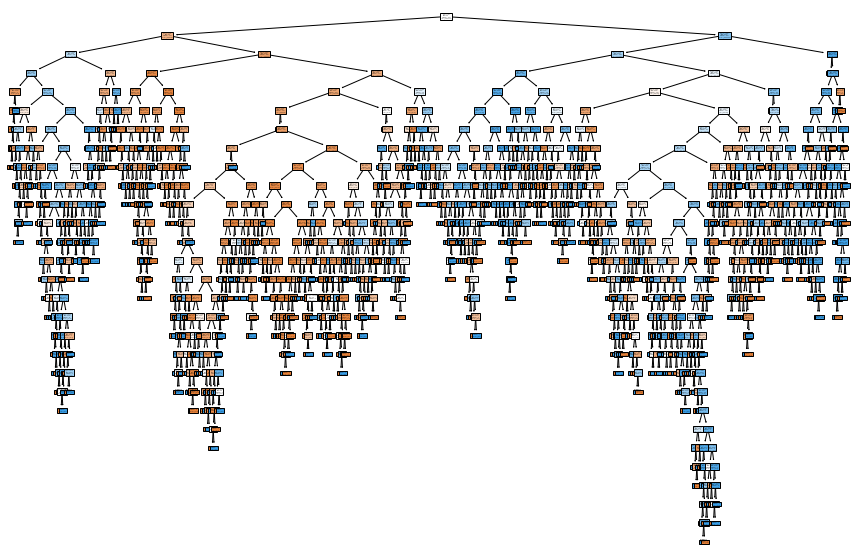

In [91]:
# Building Decision Tree Model
dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dTree.fit(x_os_train, y_os_train)

# Scoring our Decision Tree
print(dTree.score(x_os_train, y_os_train))
print(dTree.score(x_test, y_test))

# Visualizing the Decision Tree
plt.figure(figsize=(15,10))
tree.plot_tree(dTree,filled=True)

In [92]:
# Reducing Overfitting
dTreeR = DecisionTreeClassifier(criterion = 'gini', max_depth = 4, random_state=1)
dTreeR.fit(x_os_train, y_os_train)
print(dTreeR.score(x_os_train, y_os_train))
print(dTreeR.score(x_test, y_test))

DecisionTreeClassifier(max_depth=4, random_state=1)

0.7718742934659734
0.7304560260586319


0.7304560260586319


<IPython.core.display.Javascript object>

<Figure size 504x360 with 0 Axes>

Accuracy Score for Decision Tree:  0.7304560260586319


Decision Tree Classifier Report


              precision    recall  f1-score   support

           0       0.85      0.78      0.81      1838
           1       0.47      0.58      0.52       618

    accuracy                           0.73      2456
   macro avg       0.66      0.68      0.67      2456
weighted avg       0.75      0.73      0.74      2456



ROC score:  0.6808230417894785


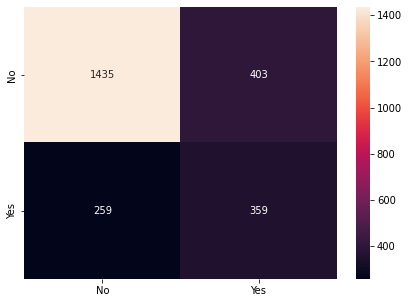

In [93]:
# Decision Tree Analysis Model
print(dTreeR.score(x_test , y_test))
y_predict = dTreeR.predict(x_test)

cm = confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')

## Saving the Classification Reports for Meta Learning Models:

pred_report_tree = classification_report(y_test, y_predict , digits=2)

### Saving the ROC_AUC Scores for Meta Learning Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_predict)
roc_tree = auc(false_positive_rate, true_positive_rate)

## Saving the accuracy

accuracy = accuracy_score(y_test, y_predict)

print("Accuracy Score for Decision Tree: ",accuracy)
print("\n")
print("Decision Tree Classifier Report")
print("\n")
print(pred_report_tree)
print("\n")
print("ROC score: ",roc_tree)

In [94]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(dTree , x , y, scoring = 'accuracy', 
                                          cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_predict)

print("The Cross Validation Score For Baseline Decision Tree Classifier Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Decision Tree Classifier Model After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline Decision Tree Classifier Model After Fold Cross Validation Is :  
 [0.64835165 0.71550672 0.6971917  0.86324786 0.99267399 1.
 0.96332518 0.7799511  0.77017115 0.82640587]
 
The Accuracy Score For Baseline Decision Tree Classifier Model After Cross Validation Is: 
 0.7304560260586319


In [95]:
### Hyper-parameter Tuning of Decision Tree by Grid Search CV 
criterion = ['gini','entropy','log_class']
max_depth = [1,3,5,7]
max_features = ['sqrt','log2',None]
random_state=[1,5,7,10]

param_grid = dict(criterion=criterion,
                  max_depth=max_depth,
                  max_features=max_features,
                  random_state=random_state)

grid = GridSearchCV(estimator = dTree,
                    param_grid = param_grid,
                    scoring ='accuracy',
                    verbose = 1,
                    n_jobs =-1, 
                    cv = 10)
grid_result = grid.fit(x_os_train, y_os_train)

print('Best Score: ', grid_result.best_score_)

print('Best Params: ', grid_result.best_params_)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Score:  0.8123560088963877
Best Params:  {'criterion': 'gini', 'max_depth': 7, 'max_features': None, 'random_state': 5}


DecisionTreeClassifier(max_depth=7, random_state=1)

0.8438842414650689
0.7504071661237784
0.7504071661237784


<IPython.core.display.Javascript object>

<Figure size 504x360 with 0 Axes>

Accuracy Score for Decision Tree:  0.7504071661237784


Decision Tree Classifier Report


              precision    recall  f1-score   support

           0       0.87      0.78      0.82      1838
           1       0.50      0.66      0.57       618

    accuracy                           0.75      2456
   macro avg       0.69      0.72      0.70      2456
weighted avg       0.78      0.75      0.76      2456



ROC score:  0.71939300139803


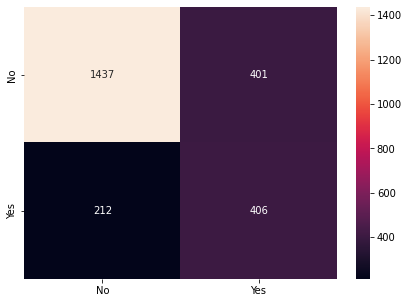

In [96]:
dTreeR2 = DecisionTreeClassifier(criterion = 'gini', max_depth = 7, max_features=None, random_state=1)
dTreeR2.fit(x_os_train, y_os_train)
print(dTreeR2.score(x_os_train, y_os_train))
print(dTreeR2.score(x_test, y_test))

# Decision Tree Analysis Model
print(dTreeR2.score(x_test , y_test))
y_predict = dTreeR2.predict(x_test)
cm = confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')

## Saving the Classification Reports for Meta Learning Models:

pred_report_tree = classification_report(y_test, y_predict , digits=2)

### Saving the ROC_AUC Scores for Meta Learning Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_predict)
roc_tree = auc(false_positive_rate, true_positive_rate)

## Saving the accuracy

accuracy = accuracy_score(y_test, y_predict)

print("Accuracy Score for Decision Tree: ",accuracy)
print("\n")
print("Decision Tree Classifier Report")
print("\n")
print(pred_report_tree)
print("\n")
print("ROC score: ",roc_tree)

### Random Forest Classification

In [97]:
rf_model = RandomForestClassifier()
rf_model.fit(x_os_train, y_os_train)
y_predict= rf_model.predict(x_test)

## Saving the Classification Reports for Meta Learning Models:

pred_report_rf = classification_report(y_test, y_predict , digits=2)

### Saving the ROC_AUC Scores for Meta Learning Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_predict)
roc_rf = auc(false_positive_rate, true_positive_rate)

## Saving the accuracy

accuracy = accuracy_score(y_test, y_predict)

print("Accuracy Score for Random Forest: ",accuracy)
print("\n")
print("ROC score: ",roc_rf)
print("\n")
print("Random Forest Classifier Report")
print("\n")
print(pred_report_rf)

RandomForestClassifier()

Accuracy Score for Random Forest:  0.8599348534201955


ROC score:  0.8038479281335067


Random Forest Classifier Report


              precision    recall  f1-score   support

           0       0.90      0.92      0.91      1838
           1       0.74      0.69      0.71       618

    accuracy                           0.86      2456
   macro avg       0.82      0.80      0.81      2456
weighted avg       0.86      0.86      0.86      2456



In [98]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(rf_model , x , y, scoring = 'accuracy', cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_predict)

print("The Cross Validation Score For Baseline Random Forest Classifier Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Random Forest Model After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline Random Forest Classifier Model After Fold Cross Validation Is :  
 [0.83638584 0.79365079 0.77411477 0.88888889 0.99267399 1.
 0.96821516 0.85085575 0.87530562 0.89242054]
 
The Accuracy Score For Baseline Random Forest Model After Cross Validation Is: 
 0.8599348534201955


In [99]:
### Hyper-parameter Tuning of Random Forest Classifier

n_estimators = [1,10,100] 
criterion = ['gini','entropy','log_class']
max_features = ['sqrt','log2',None]
bootstrap=[True,False]
random_state=[1,5,7,10]
class_weight=['balanced','balanced_subsample', None]

param_grid = dict(n_estimators=n_estimators,
                  criterion=criterion,
                  max_features=max_features,
                  bootstrap=bootstrap,
                  random_state=random_state,
                  class_weight=class_weight)

grid = GridSearchCV(estimator = rf_model,
                    param_grid = param_grid,
                    scoring ='accuracy',
                    verbose = 1,
                    n_jobs =-1, 
                    cv = 3)
grid_result = grid.fit(x_os_train, y_os_train)

print('Best Score: ', grid_result.best_score_)

print('Best Params: ', grid_result.best_params_)

Fitting 3 folds for each of 648 candidates, totalling 1944 fits
Best Score:  0.9058375390840734
Best Params:  {'bootstrap': False, 'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'sqrt', 'n_estimators': 100, 'random_state': 5}


In [100]:
rf_model2 = RandomForestClassifier(bootstrap=False, class_weight='balanced',criterion='gini',max_features='sqrt', n_estimators=100, random_state=5)
rf_model2.fit(x_os_train, y_os_train)
y_predict= rf_model2.predict(x_test)

## Saving the Classification Reports for Meta Learning Models:

pred_report_rf = classification_report(y_test, y_predict , digits=2)

### Saving the ROC_AUC Scores for Meta Learning Algorithms

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_predict)
roc_rf = auc(false_positive_rate, true_positive_rate)

## Saving the accuracy

accuracy = accuracy_score(y_test, y_predict)

print("Accuracy Score for Random Forest: ",accuracy)
print("\n")
print("ROC score: ",roc_rf)
print("\n")
print("Random Forest Classifier Report")
print("\n")
print(pred_report_rf)

RandomForestClassifier(bootstrap=False, max_features='log2', n_estimators=10,
                       random_state=5)

Accuracy Score for Random Forest:  0.8509771986970684


ROC score:  0.7763820953548074


Random Forest Classifier Report


              precision    recall  f1-score   support

           0       0.88      0.93      0.90      1838
           1       0.74      0.63      0.68       618

    accuracy                           0.85      2456
   macro avg       0.81      0.78      0.79      2456
weighted avg       0.85      0.85      0.85      2456



### Gradient Boosting Algorithm

In [101]:
clf= GradientBoostingClassifier()
clf.fit(x_os_train, y_os_train)
y_pred = clf.predict(x_test)

### Saving the ROC_AUC Score

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc_2 = auc(false_positive_rate, true_positive_rate)

########## Printing the Accuracy Score

print("Accuracy Score: ",accuracy_score(y_test, y_pred))

########## Printing the ROC_AOC Score

print("roc_auc_2 score: ", roc_auc_2)

########## Printing the Classification Report

print(classification_report(y_test, y_pred, digits=2))




GradientBoostingClassifier()

Accuracy Score:  0.7894951140065146
roc_auc_2 score:  0.737452944138662
              precision    recall  f1-score   support

           0       0.87      0.84      0.86      1838
           1       0.57      0.63      0.60       618

    accuracy                           0.79      2456
   macro avg       0.72      0.74      0.73      2456
weighted avg       0.80      0.79      0.79      2456



In [103]:
##### K Fold Cross Validation ####
    
cross_valid = True
cv_score = cross_val_score(clf , x , y, scoring = 'accuracy', cv = KFold(n_splits = 10))
accuracy = accuracy_score(y_test, y_predict)

print("The Cross Validation Score For Baseline Gradient Boosting Classifier Model After", "Fold Cross Validation Is :  \n", cv_score)
print(" ")
print("The Accuracy Score For Baseline Gradient Boosting Classifier Model After Cross Validation Is: \n", accuracy)

The Cross Validation Score For Baseline Gradient Boosting Classifier Model After Fold Cross Validation Is :  
 [0.84371184 0.78144078 0.78632479 0.7985348  0.82783883 0.83374083
 0.84352078 0.81418093 0.87408313 0.89731051]
 
The Accuracy Score For Baseline Gradient Boosting Classifier Model After Cross Validation Is: 
 0.8509771986970684


In [ ]:
# Save the trained regression model as a pickle string.
saved_model = pickle.dumps(rf_model1)

In [105]:
# Save the trained classification model as a pickle string.
saved_model = pickle.dumps(knn_model2)

## Conclusion:
The above are the models we have selected to forecast the rain for tomorrow